# Regional tropical cyclone impact functions for globally consistent risk assessments

*Samuel Eberenz$^{(1,2)}$, Samuel Lüthi$^{(1,2)}$, David N. Bresch$^{(1,2)}$*

*1) Institute for Environmental Decisions, ETH Zurich, Switzerland*

*2) Federal Office of Meteorology and Climatology MeteoSwiss, Switzerland*


*How to cite*: Eberenz, S., Lüthi, S., and Bresch, D. N.: Regional tropical cyclone impact functions for globally consistent risk assessments, Nat. Hazards Earth Syst. Sci., https://doi.org/10.5194/nhess-2020-229, 2021.

------------


This Jupyter Notebook replicates the main results and plots of the publication (https://doi.org/10.5194/nhess-2020-229) using the open source risk assessment model CLIMADA (https://github.com/CLIMADA-project/climada_python). To run this jupyter file you need to install CLIMADA V.1.4.1 or V.1.5.1.

The purpose of this Jupyter Notebook is the replication of key figures and results presented in the paper. Too keep things lean, it does not reproduce the complete calibration routine of impact functions from scratch. It is not required to run any other scripts to reproduce the figures.

In [ ]:
"""load required modules from Python libraries, including climada_python"""
%matplotlib inline

import os
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from scipy.interpolate import griddata
import pandas as pd
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.io.shapereader as shpreader
from iso3166 import countries as iso_cntry
import itertools
import numpy as np
from matplotlib.collections import LineCollection
from matplotlib.colors import BoundaryNorm, ListedColormap, LogNorm
from matplotlib.lines import Line2D
import matplotlib.cm as cm_mp

import climada.util.plot as u_plot
from climada.util.constants import SYSTEM_DIR
from climada.util.scalebar_plot import scale_bar
from climada.engine import Impact
from climada.entity import IFTropCyclone, ImpactFuncSet
from climada.hazard import TCTracks, Centroids, TropCyclone
from climada.entity.exposures.litpop import LitPop

# Import stable version of calibrated impact function set:
from if_trop_cyclone_stable_202006 import IFSTropCyclone, IFTropCyclone 
## Alternatively, import impact functions from (your local) CLIMADA repository:
# from climada.entity.impact_funcs.trop_cyclone import IFSTropCyclone 

import tc_calibration_functions as tc_cal

"""Init data and variables:
Before starting, please set the path to the data directory.
data_dir_local needs to corresponds to the folder "data" in the climada_papers folder:"""
# path to input files: 
# data_dir_local = "..."
data_dir_local =  os.path.abspath(os.path.join(SYSTEM_DIR, "..", "..", "..", \
                        "climada_papers", "202005_tropical_cyclone_calibration", "data"))
plots_dir_local =  os.path.abspath(os.path.join(SYSTEM_DIR, "..", "..", "..", \
                        "climada_papers", "202005_tropical_cyclone_calibration", "plots"))

save_plots = True

# set configuration variables to the same values as in tc_calibration_config.py:
REF_YEAR = 2014
RES_ARCSEC = 300
YEAR_RANGE = [1980, 2017]

colors3 = ['#1b9e77', '#7570b3', '#d95f02'] # green / blue / orange
# colors per region:
colors9 = ['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf', '#737373']
colors9b = ['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf', '#252525']
colors9c = ['#e41a1c','#4eb3d3','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf', '#252525']
colors10 = colors9b + ['#f0f0f0'] # regions + rest of world (ROW)

regions_short = ['NA1', 'NA2', 'NI', 'OC', 'SI', 'WP1', 'WP2', 'WP3', 'WP4']
regions_long = dict()
regions_long[regions_short[0]] = 'Caribbean and Mexico (NA1)' # NA1; 'Caribbean and Mexico'  # CAM
regions_long[regions_short[1]] = 'USA and Canada (NA2)' # NA2; 'USA and Canada' # NAM
regions_long[regions_short[2]] = 'North Indian (NI)' # NI
regions_long[regions_short[3]] = 'Oceania (OC)' # OC, 'Southern Hemisphere' # SHE
regions_long[regions_short[4]] = 'South Indian (SI)' # SI, 'Southern Hemisphere' # SHE
regions_long[regions_short[5]] = 'South East Asia (WP1)' # WP1; 'South East Asia' # SEA
regions_long[regions_short[6]] = 'Philippines (WP2)' # WP2; 'Philippines' # PHL
regions_long[regions_short[7]] = 'China Mainland (WP3)' # WP3; 'China' # CHN
regions_long[regions_short[8]] = 'North West Pacific (WP4)' # WP4; 'North West Pacific' # NWP

# import input files:
plot_data_dir_local =  "plot_data"

results_def_IF = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_202002_default_IF.csv'),\
                                     encoding="ISO-8859-1", header=0)
results_closest_ratio = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_202002_closest_log_ratio.csv'),\
                                     encoding="ISO-8859-1", header=0)
results_rmsf = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_202002_rmsf_log_ratio.csv'),\
                                     encoding="ISO-8859-1", header=0)
results_tdr = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_202002_tot_impact_scaling_1.00.csv'),\
                                     encoding="ISO-8859-1", header=0)
full_cal_range_df_tdr = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_202002_tot_impact_res_scaling_1.00.csv'),\
                                     encoding="ISO-8859-1", header=0)
full_cal_range_df_rmsf = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_202002_RMSF_res.csv'),\
                                     encoding="ISO-8859-1", header=0)
events_df_rmsf_if = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_regional_RMSF_IF_all.csv'),\
                                     encoding="ISO-8859-1", header=0)
events_df_tdr_if = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_regional_TDR_IF_all.csv'),\
                                     encoding="ISO-8859-1", header=0)

results_table = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     '202005_calibration_results_table.csv'),\
                                     encoding="ISO-8859-1", header=0)

results_aad = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     '202006_TC_AAD.csv'),\
                                     encoding="ISO-8859-1", header=0)

countries_overview = pd.read_csv(os.path.join(data_dir_local, plot_data_dir_local, \
                                     'tc_cal_202005_country_overview.csv'),\
                                     encoding="ISO-8859-1", header=0)


## Figure 2: Default Impact Function

Plot schematic of idealized tropical cyclone impact function based on K. Emanuel (2011): "Global Warming Effects on U.S. Hurricane Damage", DOI: 10.1175/WCAS-D-11-00007.1

$V_{half}$ is the hazard intensity (i.e. maximum sustained wind speed) at which the relative impact reaches 50% of the exposed asset value. No impact occurs for an intensity below $V_{thresh}$.

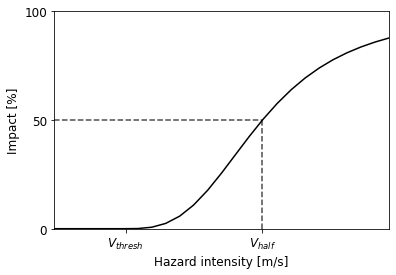

In [4]:
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 12}
plt.rc('font', **font)

# init impact function with v_half=74.7 m/s:
IFS_default = ImpactFuncSet()
if_tc = IFTropCyclone()
if_tc.set_emanuel_usa(v_thresh=25.7, v_half=74.7, scale=1)
if_tc.id = 1
IFS_default.append(if_tc)

# plot impact function
fig_IF_schematic = plt.figure(facecolor='w')
ax_IF_ = fig_IF_schematic.add_subplot(1,1,1)
ax_IF_.plot(IFS_default.get_func()['TC'][1].intensity, IFS_default.get_func()['TC'][1].mdd * IFS_default.get_func()['TC'][1].paa * 100, c='k', linestyle='-', label=None)
ax_IF_.plot([74.7, 74.7], [0, 50], c='k', linestyle='--', label=None, alpha=.7)
ax_IF_.plot([0, 74.7], [50, 50], c='k', linestyle='--', label=None, alpha=.7)
ax_IF_.set_xlim((0, IFS_default.get_func()['TC'][1].intensity.max()))
ax_IF_.set_xticks([25.7, 74.7])
ax_IF_.set_yticks([0, 50, 100])
ax_IF_.set_yticklabels(['0', '50', '100'])
ax_IF_.set_xticklabels(['$V_{thresh}$', '$V_{half}$'])
ax_IF_.set_ylim((0, 100))
ax_IF_.set_xlabel('Hazard intensity [m/s]')
ax_IF_.set_ylabel('Impact [%]')

if save_plots:
    fig_IF_schematic.savefig(os.path.join(plots_dir_local, 'fig02_vector.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_IF_schematic.savefig(os.path.join(plots_dir_local, 'fig02_pixel.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)

## Figure 3: World map
World map highlighting the 53 countries used for calibration, color coded per calibration region. The tracks of 376 TCs used for calibration are plotted as red lines. The number of resulting matched events N is displayed per region. Regions by color: red: the Caribbean with Central America and Mexico (NA1); blue: the USA and Canada (NA2); green: North Indian Ocean (NI); purple: Oceania with Australia (OC); orange: South Indian Ocean (SI); yellow: South East Asia (WP1), brown: the Philippines (WP2), rose: China Mainland (WP3); black: rest of North West Pacific Ocean (WP4). The countries per region are listed in Table A1.

2020-12-01 17:12:09,877 - climada.hazard.tc_tracks - INFO - Reading /Users/eberenzs/Documents/Projects/climada_papers/202005_tropical_cyclone_calibration/data/ibtracs_calibration/ibtracs_global_intp-None_1980081S12170.csv
2020-12-01 17:12:09,891 - climada.hazard.tc_tracks - INFO - Reading /Users/eberenzs/Documents/Projects/climada_papers/202005_tropical_cyclone_calibration/data/ibtracs_calibration/ibtracs_global_intp-None_1980126N08150.csv
2020-12-01 17:12:09,913 - climada.hazard.tc_tracks - INFO - Reading /Users/eberenzs/Documents/Projects/climada_papers/202005_tropical_cyclone_calibration/data/ibtracs_calibration/ibtracs_global_intp-None_1980214N11330.csv
2020-12-01 17:12:09,933 - climada.hazard.tc_tracks - INFO - Reading /Users/eberenzs/Documents/Projects/climada_papers/202005_tropical_cyclone_calibration/data/ibtracs_calibration/ibtracs_global_intp-None_1980296N05165.csv
2020-12-01 17:12:09,951 - climada.hazard.tc_tracks - INFO - Reading /Users/eberenzs/Documents/Projects/climada_p

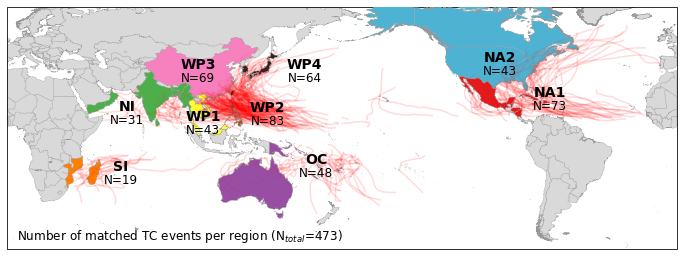

In [7]:
"""load and initiate data for world maps"""

# lists of countries per region (used for calibration):
region_ids_cal = dict()
region_ids_cal['NA1'] = ['ABW', 'AIA', 'ANT', 'ARG', 'ATG', 'BHS', 'BLZ', 'BMU', 'BOL', 'BRA', 'BRB', 'CHL', 'COL', 'CPV', 'CRI', 'CUB', 'CYM', 'DMA', 'DOM', 'ECU', 'FLK', 'GLP', 'GRD', 'GTM', 'GUF', 'GUY', 'HND', 'HTI', 'JAM', 'KNA', 'LCA', 'MEX', 'MSR', 'MTQ', 'NIC', 'PAN', 'PER', 'PRI', 'PRY', 'SHN', 'SLV', 'SUR', 'TCA', 'TTO', 'URY', 'VCT', 'VEN', 'VGB', 'VIR']
region_ids_cal['NA2'] = ['USA', 'CAN']
region_ids_cal['NI'] = ['AFG', 'ARE', 'ARM', 'AZE', 'BGD', 'BHR', 'BTN', 'DJI', 'ERI', 'ETH', 'GEO', 'IND', 'IRN', 'IRQ', 'ISR', 'JOR', 'KAZ', 'KGZ', 'KWT', 'LBN', 'LKA', 'MDV', 'MMR', 'MNG', 'NPL', 'OMN', 'PAK', 'QAT', 'SAU', 'SOM', 'SYR', 'TJK', 'TKM', 'UGA', 'UZB', 'YEM']   
region_ids_cal['OC'] = ['AUS', 'ASM', 'COK', 'FJI', 'FSM', 'GUM', 'KIR', 'MHL', 'MNP', 'NCL', 'NFK', 'NIU', 'NRU', 'PCN', 'PNG', 'PYF', 'SLB', 'TKL', 'TLS', 'TON', 'TUV', 'VUT', 'WLF', 'WSM']
region_ids_cal['SI'] = ['MDG', 'MLI', 'MOZ', 'ZAF']
region_ids_cal['WP1'] = ['LAO', 'PRK', 'MYS', 'THA', 'VNM', 'KHM']
region_ids_cal['WP2'] = ['PHL']
region_ids_cal['WP3'] = ['CHN']
region_ids_cal['WP4'] = ['KOR', 'MAC', 'JPN', 'HKG', 'TWN', 'RUS']
regions_short = list(region_ids_cal.keys())

# coordinates for the plotting of labels on map
regions_coord = dict()
regions_coord[regions_short[0]] = (19, -68)#(6., -114) # NA1; 'Caribbean and Mexico'  # CAM
regions_coord[regions_short[1]] = (38, -95) # (31.5, -59) # NA2; 'USA and Canada' # NAM
regions_coord[regions_short[2]] = (11.3, 64.35) # NI
regions_coord[regions_short[3]] = (-17.3, +166) # OC, 'Southern Hemisphere' # SHE
regions_coord[regions_short[4]] = (-21, 61) # SI, 'Southern Hemisphere' # SHE
regions_coord[regions_short[5]] = (6.1, 105.2) # WP1; 'South East Asia' # SEA
regions_coord[regions_short[6]] = (11., 140) # WP2; 'Philippines' # PHL
regions_coord[regions_short[7]] = (34, 102.5) # WP3; 'China' # CHN
regions_coord[regions_short[8]] = (34, 160) # WP4; 'North West Pacific' # NWP

# exclude countries not in calibration:
exclude_cntries = dict()
for reg in region_ids_cal:
    exclude_cntries[reg] = list()
    for cntry in region_ids_cal[reg]:
        if not cntry in results_closest_ratio.country.unique():
            # print('%s: %s' %(reg, cntry))
            exclude_cntries[reg].append(cntry)
for reg in region_ids_cal:
    for cntry_ex in exclude_cntries[reg]:
        if cntry_ex in region_ids_cal[reg]:
            region_ids_cal[reg].remove(cntry_ex)

shpfilename = shpreader.natural_earth(resolution='10m',
                                          category='cultural',
                                          name='admin_0_countries')
reader = shpreader.Reader(shpfilename)
countries = reader.records()

# initiate TC tracks used for calibration:
print("Warning: TC track data needs to be downloaded from IBTrACS seperately or requested from the authors.")
tracks_cal = TCTracks()
tracks_cal_path = list()
for track_id in list(np.unique(results_closest_ratio.ibtracsID)):
    tracks_cal_path.append(os.path.join(data_dir_local, 'ibtracs_calibration', \
                          'ibtracs_global_intp-None_%s.csv' % (track_id)))
    track = TCTracks()
tracks_cal.read_processed_ibtracs_csv(tracks_cal_path)

"""make world map plot"""

fig_map, ax = plt.subplots(figsize=(8*1.5, 10*1.5), \
              subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180.0)})
ax.set_extent([-100, 30, -60, 70], crs=ccrs.PlateCarree())
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 14}
plt.rc('font', **font)
track_color = 'r' # '#dd1c77'
for track in tracks_cal.data:
    if (track.lon.values>0).any() and (track.lon.values<0).any():
        i_break = [0]
        sign = np.sign(track.lon.values[0])
        for i, longitude in enumerate(track.lon.values):
            if np.sign(longitude)!=sign:
                sign = (-1)*sign
                i_break.append(i)
        for i, _ in enumerate(i_break):
            if i>0:
                plt.plot(track.lon.values[i_break[i-1]:i_break[i]], \
                         track.lat.values[i_break[i-1]:i_break[i]], \
                         track_color, alpha=0.09, zorder=2, transform=ccrs.PlateCarree())
                plt.plot(track.lon.values[i_break[i-1]:i_break[i]], \
                         track.lat.values[i_break[i-1]:i_break[i]], \
                         track_color, alpha=0.05, zorder=4, transform=ccrs.PlateCarree())
    else:
        plt.plot(track.lon.values, track.lat.values, track_color, \
                 alpha=0.09, transform=ccrs.PlateCarree(), zorder=2)
        plt.plot(track.lon.values, track.lat.values, track_color, \
                 alpha=0.05, transform=ccrs.PlateCarree(), zorder=4)

for country in countries:
    color = '#d9d9d9' #'#cccccc'
    zorder_ = 1
    for idr, reg in enumerate(regions_short):
        if country.attributes['ADM0_A3'] in region_ids_cal[reg]:
            color=colors9c[idr],
            plotted = True
            zorder_ = 3
            break

    ax.add_geometries([country.geometry], ccrs.PlateCarree(), linewidth=0.3, \
                      edgecolor='#969696', facecolor=color, \
                      label=country.attributes['ADM0_A3'], zorder=zorder_)

# add labels on map:
factor = .8
for reg in region_ids_cal:
    plt.text(regions_coord[reg][1], regions_coord[reg][0]+3.5*factor, reg,
          horizontalalignment='center', fontweight='bold', 
          transform=ccrs.PlateCarree(), zorder=22)
# # uncomment to add further data on map:
#    plt.text(regions_coord[reg][1], regions_coord[reg][0]-14.1*factor, 
#          '%1.2f' %(results_table.loc[results_table.region==reg, 'def_TDR'].values[0]),
#          horizontalalignment='center', fontweight='normal', 
#          transform=ccrs.PlateCarree(), zorder=22)
    plt.text(regions_coord[reg][1], regions_coord[reg][0]-5.3*factor, 
          'N=%1.0f' %(results_table.loc[results_table.region==reg, 'N'].values[0]),
          horizontalalignment='center', fontweight='normal', fontsize=12, 
          transform=ccrs.PlateCarree(), zorder=22)

plt.text(5, -55, 'Number of matched TC events per region (N$_{total}$=%1.0f)' \
         %(results_table.loc[results_table.region=='GLB', 'N'].values[0]),
        horizontalalignment='left', fontweight='normal', fontsize=12, 
        transform=ccrs.PlateCarree(), zorder=22)

plt.show()

In [8]:
"""save world map plots"""
if save_plots:
    fig_map.savefig(os.path.join(plots_dir_local, 'fig03_vector.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', transform=ccrs.PlateCarree(), \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_map.savefig(os.path.join(plots_dir_local, 'fig03_pixel.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)

## Figure 4: EDR Boxplot
Spread of event damage ratio (EDR, boxplot) and total damage ratio (TDR) per region before calibration (Vhalf=74.7 m/s) per region.

The plots are based on data from 473 TC events affecting 53 countries. The EDR boxplots show the median (green line), the first and third quartiles (IQR, blue box), data points outside the IQR but not more than 1.5·IQR distance from either the first or the third quartile (black whiskers), and outliers (black circles). The additional markers show TDR before calibrated (green diamond).

The regions are the Caribbean with Central America and Mexico (NA1); the USA and Canada (NA2); North Indian Ocean (NI); Oceania with Australia (OC); South Indian Ocean (SI); South East Asia (WP1), the Philippines (WP2), China Mainland (WP3); rest of North West Pacific Ocean (WP4).

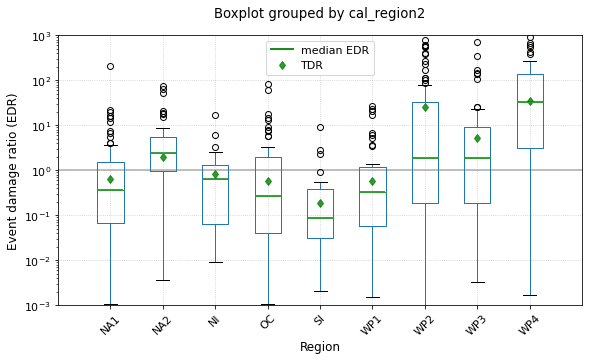

In [5]:
"""Figure 4"""
wdth = 10
wdth_i = .9
hght = 5
colors = ['green', 'blue',  'red']
results_def_IF['ratio'] = results_def_IF.climada_impact/results_def_IF.emdat_impact_scaled

# Unsorted boxplot of EDR per region:
fig_boxplot1 = plt.figure(facecolor='w', figsize=(1+min(9*wdth_i, \
                         wdth_i*len(results_def_IF['cal_region2'].unique())), hght))
ax_bp1 = fig_boxplot1.add_subplot(1,1,1)
results_def_IF.boxplot(ax=ax_bp1, by=["cal_region2"], column="ratio")
ax_bp1.set_ylim([1e-3, 1000])
ax_bp1.set_yscale('log')
ax_bp1.set_xlim([0, len(list(ax_bp1.get_xticklabels()))+1])
for idx, xtickl in enumerate(list(ax_bp1.get_xticklabels())):
    if not idx:
        label='TDR'
        ax_bp1.plot(-1,-1, marker=None, color='green', label='median EDR', alpha=.9, lw=2)
    else:
        label = None
    tdr_reg_def = results_def_IF.loc[results_def_IF.cal_region2==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
                    results_def_IF.loc[results_def_IF.cal_region2==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
    median_edr = results_def_IF.loc[results_def_IF.cal_region2==xtickl.__dict__['_text'], 'ratio'].median()
    ax_bp1.plot(idx+1, tdr_reg_def, color=colors[0], marker='d', lw=0, linestyle=None, alpha=.8, label=label)
    ax_bp1.scatter([idx+1], [median_edr], s=715, color=colors[0], marker='_', alpha=1, label=None)
#    """ uncomment to also plot TDR per region for RMSF and TDR optimization: """
#    tdr_reg_RMSF = events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
#                    events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
#    tdr_reg_TDR = events_df_tdr_if.loc[events_df_tdr_if.cal_region2==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
#                    events_df_tdr_if.loc[events_df_tdr_if.cal_region2==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
#    ax_bp1.scatter([idx+1], [median_edr], s=30, color=colors[0], marker='_', lw=0, linestyle=None, alpha=1, label=None)
#    ax_bp1.plot(idx+1, tdr_reg_RMSF, color=colors[1], marker='o', lw=0, linestyle=None, alpha=.8, label=labels[1])
#    ax_bp.plot(idx+1, tdr_reg_TDR, color=colors[2], marker='s', ls=None, alpha=.8, label=labels[2])
    
ax_bp1.axhline(1, color='black', alpha=.333, label=None, zorder=0)
ax_bp1.legend(loc='upper center')
ax_bp1.grid(True, linestyle='dotted', alpha=.7)#, axis='y')
plt.title('')
plt.xlabel('Region', fontsize=12)
plt.ylabel('Event damage ratio (EDR)', fontsize=12)
plt.xticks(rotation=45)

if save_plots:
    fig_boxplot1.savefig(os.path.join(plots_dir_local, 'fig04_vector.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_boxplot1.savefig(os.path.join(plots_dir_local, 'fig04_pixel.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)

## Figure 5: Calibrated regional impact functions
Regional impact functions for nine calibration regions, based on complementary calibration approaches: RMSF optimized (blue), TDR optimized (red), and the median Vhalf obtained from fitting impact functions for each individual event to obtain an EDR of 1 (dashed). The shading demarcates the range containing 50% of the individually fitted impact functions per region, i.e. the interquartile range (IQR).

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


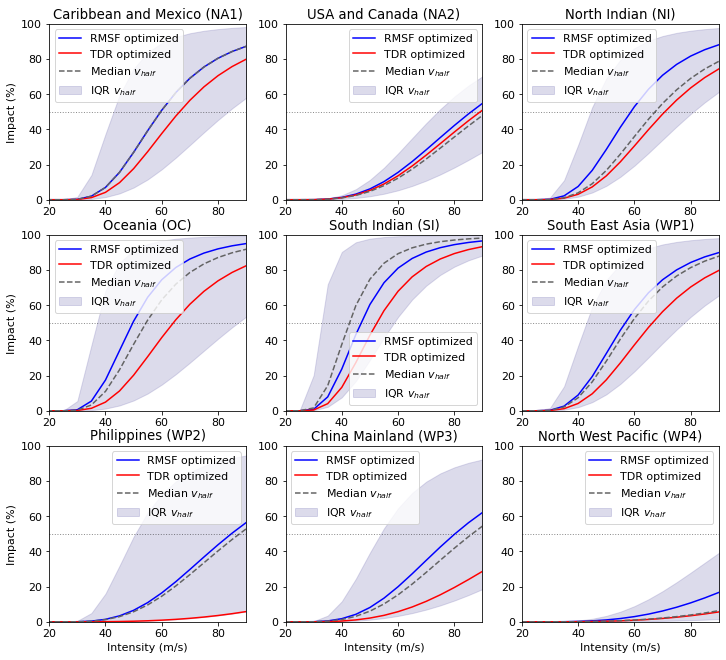

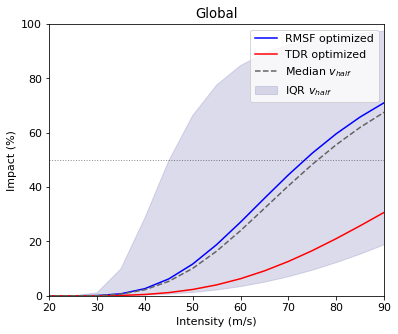

In [2]:
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 11}
plt.rc('font', **font)

"""initiate calibrated impact functions in new dict of impact function sets (IFSs):"""
quantiles = [.25, .5, .75]
IFSs = dict()

for q in quantiles:
    IFSs['%.2f' % (q)] = IFSTropCyclone()
    IFSs['%.2f' % (q)].set_calibrated_regional_IFs(calibration_approach='EDR', q=q, \
                                   input_file_path=results_closest_ratio, version=1)
IFSs['RMSF'] = IFSTropCyclone()
IFSs['TDR'] = IFSTropCyclone()
IFSs['RMSF'].set_calibrated_regional_IFs(calibration_approach='RMSF', q=q, \
                                   input_file_path=results_rmsf, version=1)
IFSs['TDR'].set_calibrated_regional_IFs(calibration_approach='TDR', q=q, \
                                   input_file_path=results_tdr, version=1)

"""Plot calibrated impact function per region:"""
# list of curves to be added to plot, including styles and labels:
IFSs_plt = [IFSs['RMSF'], IFSs['TDR'], IFSs['0.50'], (IFSs['0.25'], IFSs['0.75'])]
labels = ['RMSF optimized', 'TDR optimized', 'Median $v_{half}$', 'IQR $v_{half}$']
linestyles = ['-', '-', '--', '']
colors = ['blue', 'red', '#636363', colors3[1]]

zorder = [7, 6, 9, 3]

# call plotting function IFS_plot() from tc_calibration_functions and save plots:
fig_IFSs, _ = tc_cal.IFS_plot(IFSs_plt, labels, colors, linestyles, zorder)

if save_plots:
    fig_IFSs.savefig(os.path.join(plots_dir_local, 'fig05_vector.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_IFSs.savefig(os.path.join(plots_dir_local, 'fig05_pixel.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)

IFSs_plt_GLB = [IFSTropCyclone(), IFSTropCyclone(), IFSTropCyclone(), (IFSTropCyclone(), IFSTropCyclone())]
for idx in [0, 1, 2]:
    IFSs_plt_GLB[idx].append(IFSs_plt[idx]._data['TC'][10])
IFSs_plt_GLB[3][0].append(IFSs_plt[3][0]._data['TC'][10])
IFSs_plt_GLB[3][1].append(IFSs_plt[3][1]._data['TC'][10])

fig_IFSs_GLB_only, _ = tc_cal.IFS_plot(IFSs_plt_GLB, labels, colors, linestyles, zorder, include_GLB=True, figsize=(6,5))
#fig_IFSs_GLB, _ = tc_cal.IFS_plot(IFSs_plt, labels, colors, linestyles, zorder, include_GLB=True, figsize=(12,27))

if save_plots:
    fig_IFSs_GLB_only.savefig(os.path.join(plots_dir_local, 'ImpactFunctions_GLB.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)

## Figure 6: Results overview
Calibration results and cost functions for nine calibration regions and all regions combined: (a) $V_{half}$: fitted impact function parameter; (b) TDR: ratio of total simulated and normalized reported damage; (c) RMSF: root-mean-squared fraction; and (d) AAD: annual expected damage. AAD is computed from all events available in EM-DAT (N=1650, green) and IBTrACS (N=4098), not just the 473 matched events used for calibration (a-c). Please refer to Tables 1 and A2 for numerical values. The regions are the Caribbean with Central America and Mexico (NA1); the USA and Canada (NA2); North Indian Ocean (NI); Oceania with Australia (OC); South Indian Ocean (SI); South East Asia (WP1), the Philippines (WP2), China Mainland (WP3); rest of North West Pacific Ocean (WP4).

/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:53: UserWarning: The handle <BarContainer object of 10 artists> has a label of '_' which cannot be automatically added to the legend.


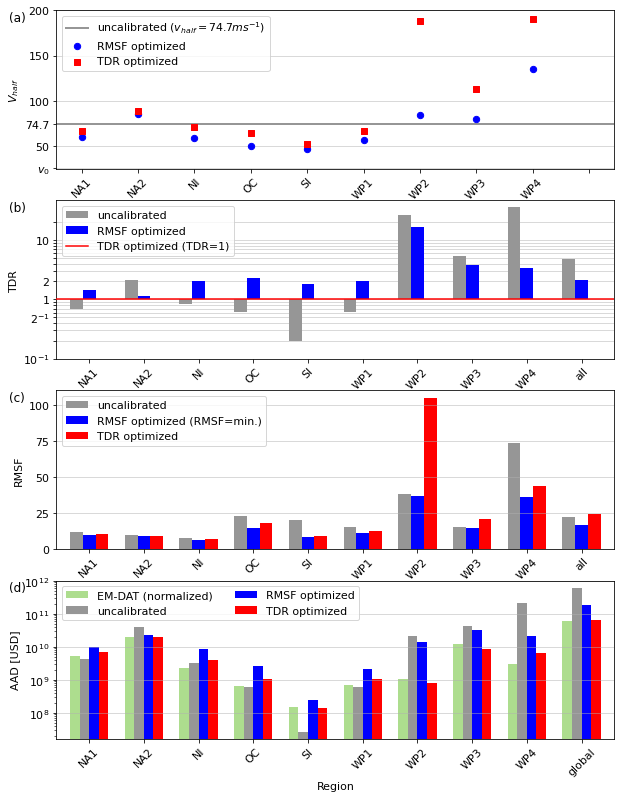

In [10]:
"""Figure 6"""
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 11}
plt.rc('font', **font)
fig_bars = plt.figure(facecolor='w', figsize=(10, 13.4))
ax_v = fig_bars.add_subplot(4,1,1)
ax_tdr = fig_bars.add_subplot(4,1,2)
ax_rmsf = fig_bars.add_subplot(4,1,3)
ax_aad = fig_bars.add_subplot(4,1,4)
width = .7
colors = ['#969696', 'blue',  'red']

## (a) V_half
ax_v.axhline(y=74.7, color=colors[0], zorder=2, lw=2., label="uncalibrated ($v_{half}=74.7 ms^{-1}$)")
res_v = results_table.loc[0:9, ['region', 'rmsf_v_half', 'tdr_v_half']]
res_v.index = np.arange(10)
res_v['i'] = np.arange(10)
res_v.loc[9, 'rmsf_v_half'] = -1e3
res_v.region = list(res_v.region[:-1])+[' ']
res_v.plot(kind='scatter', x='i', y='rmsf_v_half', marker='o', \
           s=40, ax=ax_v, c=colors[1], zorder=10, rot=45, label='RMSF optimized')
res_v.plot(kind='scatter', x='i', y='tdr_v_half', marker='s', \
           s=40, ax=ax_v, c=colors[2], zorder=10, rot=45, label="TDR optimized")

ax_v.set_ylim([25, 200])
ax_v.set_yticks(np.array([25.7, 50, 74.7, 100, 150, 200]))
ax_v.set_yticklabels(np.array(['$v_0$', 50, 74.7, 100, 150, 200]))
ax_v.grid(axis='y', alpha=.6)
ax_v.set_ylabel('$V_{half}$')
ax_v.set_xlabel('Region')
ax_v.set_xticks(res_v.i)
ax_v.set_xticklabels(res_v.region)
ax_v.legend(prop={'size': 11})

## (b) TDR
x = np.arange(len(regions_short))
res_tdr = results_table.loc[0:9, ['region', 'def_TDR', 'rmsf_TDR', 'tdr_TDR']]
res_tdr.index = list(res_tdr.region[:-1])+['all']
res_tdr.def_TDR = np.log10(list(res_tdr.def_TDR))
res_tdr.rmsf_TDR = np.log10(list(res_tdr.rmsf_TDR))
res_tdr.tdr_TDR = np.log10(list(res_tdr.tdr_TDR))
res_tdr.plot.bar(ax=ax_tdr, width=width, color=colors, zorder=10, rot=45)
ax_tdr.axhline(y=0, color=colors[2], zorder=12, lw=1.5, label='TDR optimized (TDR=1)')
ax_tdr.set_yticks(list(np.log10(np.arange(.1, 1., .1)))+list(np.log10(np.arange(1, 11, 1))) + [np.log10(20)])
ax_tdr.set_yticklabels([ '$10^{-1}$',  '',  '',  '',  '$2^{-1}$',  '',  '',  '',  '',  '1', '2', \
        '',  '',  '',  '',  '',  '',  '', '10', ''])
ax_tdr.grid(axis='y', alpha=.6, zorder=12)
ax_tdr.set_ylabel('TDR')
hh, _ = ax_tdr.get_legend_handles_labels()
ax_tdr.legend([hh[1], hh[2], hh[3], hh[0]], \
              ["uncalibrated", "RMSF optimized", '_', 'TDR optimized (TDR=1)'], \
              loc=2, prop={'size': 11})

## (c) RMSF
res_rmsf = results_table.loc[0:9, ['region', 'def_RMSF', 'rmsf_RMSF', 'tdr_RMSF']]
res_rmsf.index = list(res_rmsf.region[:-1])+['all']
res_rmsf.plot.bar(ax=ax_rmsf, width=width, color=colors, rot=45)
ax_rmsf.set_yticks(np.array([0, 25, 50, 75, 100]))
ax_rmsf.grid(axis='y', alpha=.6)
ax_rmsf.set_ylabel('RMSF')
ax_rmsf.set_xlabel('Region')
ax_rmsf.legend(["uncalibrated", 'RMSF optimized (RMSF=min.)', "TDR optimized"], \
               loc=2, prop={'size': 11})

## (d) AAD
colors_AAD = ['#addd8e'] + colors
aad = results_aad.loc[0:9, ['region', 'emdat', 'climada_def', 'climada_RMSF', 'climada_tot']]
aad.index = list(aad.region[:-1]) + ['global']
aad.plot.bar(ax=ax_aad, width=width, color=colors_AAD, rot=45)
# ax_rmsf.set_yscale('log')
#ax_aad.set_yticks(np.array([0, 25, 50, 75, 100]))
ax_aad.grid(axis='y', alpha=.6)
ax_aad.set_yscale('log')
ax_aad.set_ylabel('AAD [USD]')
ax_aad.set_xlabel('Region')
ax_aad.legend()
ax_aad.legend(["EM-DAT (normalized)", "uncalibrated", 'RMSF optimized', "TDR optimized"], \
              loc=2, ncol=2, prop={'size': 11})
# Labels:
x_alpha = -0.07
y_alpha = 0.93
ax_v.text(x_alpha, y_alpha, "(a)", size=12, ha="center", 
         transform=ax_v.transAxes)
ax_tdr.text(x_alpha, y_alpha, "(b)", size=12, ha="center", 
         transform=ax_tdr.transAxes)
ax_rmsf.text(x_alpha, y_alpha, "(c)", size=12, ha="center", 
         transform=ax_rmsf.transAxes)
ax_aad.text(x_alpha, y_alpha, "(d)", size=12, ha="center", 
         transform=ax_aad.transAxes)

if save_plots:
    fig_bars.savefig(os.path.join(plots_dir_local, 'fig06_vector.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_bars.savefig(os.path.join(plots_dir_local, 'fig06_pixel.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)


## Figure 7: Maps of the Philippines
Maps of the Philippines showing (a) the spatial distribution of asset exposure value in the Philippines (in current US dollar of 2014), based on Eberenz et al (2020); and (b-f) mapped TC impacts for Typhoon Rammasun (b), Typhoon Haiyan (c), Tropical Storm Ondoy (d), Typhoon Xangsane (e), and Typhoon Angela (f). For each event, the map shows the TC track from IBTrACS (bold solid line), the spatial distribution of simulated maximum sustained wind speed in ms-1 (dashed lines at 25, 50, and 70 ms-1), and simulated direct damage at a 10km resolution (color shading). Coast lines and the location of major cities based on Cartopy (Met Office, 2010). 


In [17]:
"""Prepare data for Figure 7: settings and define functions"""

coord_manila = (14.583333, 121.000000)
MAX_VAL = 1e11 # USD
MIN_VAL = 2e2 # USD
BUFFER_DEG_LON = .5 # Degree longitude
BUFFER_DEG_LAT = .5 # Degree latitude

# load TC information from CSV:
df_phl = pd.read_csv(os.path.join(data_dir_local, '202004_PHL_TCs.csv'), encoding="ISO-8859-1", header=0)

# functions:
def init_exposure(country='PHL'):
    """create exposure with LitPop"""
    exp = LitPop()
    exp.set_country(country, res_arcsec=RES_ARCSEC, reference_year=REF_YEAR)
    exp.set_geometry_points()
    exp.set_lat_lon()
    exp.check()
    exp['if_TC'] = 1
    return exp

def init_centroids_gridded(exp, res_arcsec=RES_ARCSEC):
    """initiates centroids depeding on grid border points and resolution"""
    # initiate bounding box based on buffer and resolution:
    min_lat = exp.latitude.min() - BUFFER_DEG_LAT
    max_lat = exp.latitude.max() + BUFFER_DEG_LAT
    min_lon = exp.longitude.min() - BUFFER_DEG_LON
    max_lon = exp.longitude.max() + BUFFER_DEG_LON
    # construct centroids:
    cent = Centroids()
    cent.set_raster_from_pnt_bounds((min_lon, min_lat, max_lon, max_lat), res=res_arcsec/3600)
    cent.set_on_land()
    cent.set_region_id()
    cent.check()
    return cent

def init_tc_tracks(df, column_name='ibtracsID'):
    """load TC tracks from column in DataFrame df"""
    path_list = list()
    for i in df.index:
        path_list.append(os.path.join(data_dir_local, 'ibtracs_calibration', \
                                     'ibtracs_global_intp-None_%s.csv' %(df.loc[i, column_name])))
    tracks = TCTracks()
    tracks.read_processed_ibtracs_csv(path_list)
    tracks.equal_timestep(time_step_h=.5)
    return tracks

def init_tc_hazard(tracks, exposure, load_haz=True):
    """init TC hazard set from TC tracks and exposure"""
    tc_hazard = TropCyclone()
    tc_hazard.set_from_tracks(tracks, centroids=init_centroids_gridded(exposure))
    tc_hazard.check()
    return tc_hazard

def calc_impact(exposure, hazard):
    """calculate impact per event from exposure and hazard"""
    if_tc = IFTropCyclone()
    if_tc.haz_type = 'TC'
    if_tc.id = 1
    if_tc.set_emanuel_usa(v_thresh=25.7, v_half=84.7, scale=1)
    IFS = ImpactFuncSet()
    IFS.append(if_tc)
    impact = Impact()
    impact.calc(exposure, IFS, hazard, save_mat=True)
    return impact

"""init data and compute impact"""
# can take several minutes
exposure = init_exposure(country='PHL')
tracks = init_tc_tracks(df_phl)
hazard = init_tc_hazard(tracks, exposure)
exposure.assign_centroids(hazard=hazard)
impact = calc_impact(exposure, hazard)


2020-12-02 15:18:57,241 - climada.entity.exposures.litpop - INFO - Generating LitPop data at a resolution of 300 arcsec.
2020-12-02 15:19:00,188 - climada.entity.exposures.gpw_import - INFO - Reference year: 2014. Using nearest available year for GWP population data: 2015
2020-12-02 15:19:00,190 - climada.entity.exposures.gpw_import - INFO - GPW Version v4.11
2020-12-02 15:19:16,919 - climada.entity.exposures.litpop - INFO - Creating the LitPop exposure took 21 s
2020-12-02 15:19:16,920 - climada.entity.exposures.base - INFO - Hazard type not set in if_
2020-12-02 15:19:16,921 - climada.entity.exposures.base - INFO - centr_ not set.
2020-12-02 15:19:16,922 - climada.entity.exposures.base - INFO - deductible not set.
2020-12-02 15:19:16,925 - climada.entity.exposures.base - INFO - cover not set.
2020-12-02 15:19:16,925 - climada.entity.exposures.base - INFO - category_id not set.
2020-12-02 15:19:16,926 - climada.entity.exposures.base - INFO - geometry not set.
2020-12-02 15:19:16,947 -

/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


2020-12-02 15:19:23,806 - climada.util.coordinates - INFO - Setting region_id 26368 points.
2020-12-02 15:19:27,462 - climada.util.coordinates - INFO - dist_to_coast: UTM 32650 (1/3)


/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


2020-12-02 15:19:31,253 - climada.util.coordinates - INFO - dist_to_coast: UTM 32651 (2/3)


/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


2020-12-02 15:19:36,659 - climada.util.coordinates - INFO - dist_to_coast: UTM 32652 (3/3)


/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


2020-12-02 15:19:37,924 - climada.hazard.trop_cyclone - INFO - Mapping 83 tracks to 26368 centroids.


/Users/eberenzs/Documents/Projects/climada_python/climada/hazard/trop_cyclone.py:440: RuntimeWarning: invalid value encountered in greater
  pres_exceed_msk = (t_cen > t_env)


2020-12-02 15:20:19,927 - climada.hazard.trop_cyclone - INFO - Progress: 10%
2020-12-02 15:20:53,842 - climada.hazard.trop_cyclone - INFO - Progress: 21%
2020-12-02 15:21:18,710 - climada.hazard.trop_cyclone - INFO - Progress: 32%
2020-12-02 15:21:56,051 - climada.hazard.trop_cyclone - INFO - Progress: 43%
2020-12-02 15:22:23,753 - climada.hazard.trop_cyclone - INFO - Progress: 54%
2020-12-02 15:22:58,254 - climada.hazard.trop_cyclone - INFO - Progress: 65%
2020-12-02 15:23:28,716 - climada.hazard.trop_cyclone - INFO - Progress: 75%
2020-12-02 15:23:54,143 - climada.hazard.trop_cyclone - INFO - Progress: 86%
2020-12-02 15:24:24,774 - climada.hazard.trop_cyclone - INFO - Progress: 97%
2020-12-02 15:24:36,710 - climada.entity.exposures.base - INFO - Matching 3525 exposures with 26368 centroids.
2020-12-02 15:24:36,712 - climada.engine.impact - INFO - Exposures matching centroids found in centr_TC
2020-12-02 15:24:36,714 - climada.engine.impact - INFO - Calculating damage for 3400 assets 

/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:97: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/cartopy/mpl/feature_artist.py:215: MatplotlibDeprecationWarning: Using a string of single character colors as a color seque

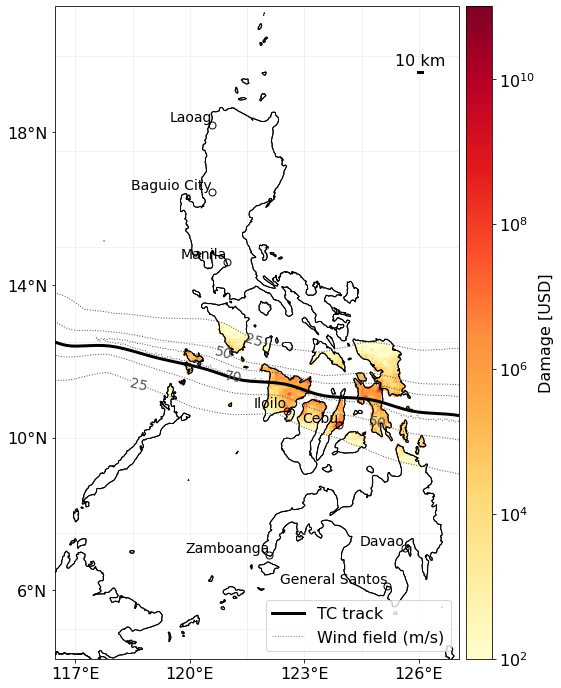

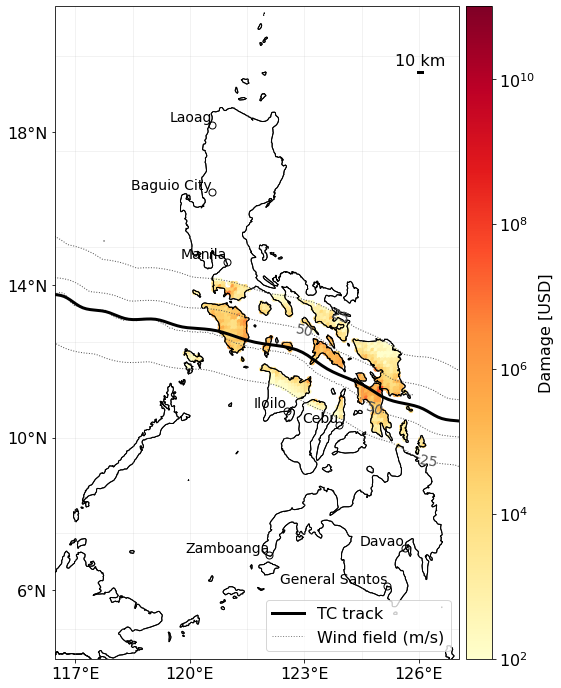

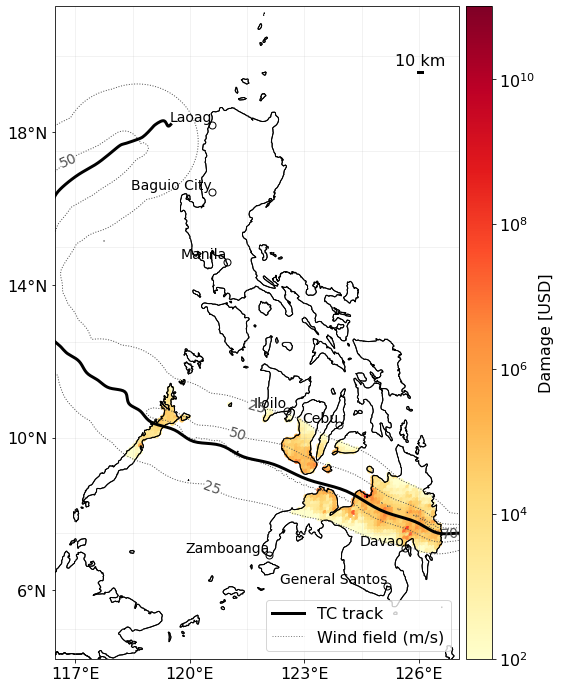

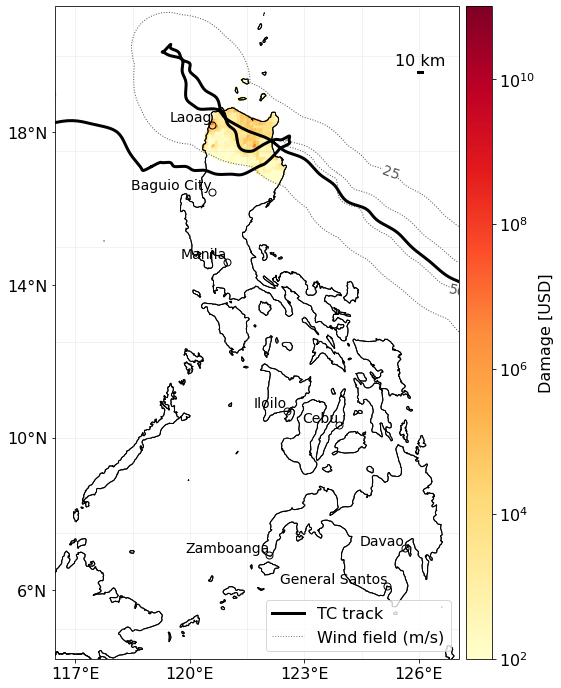

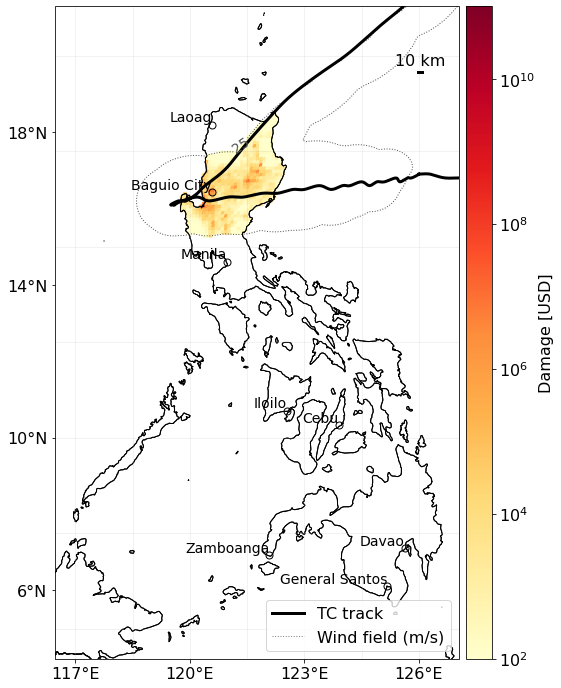

...

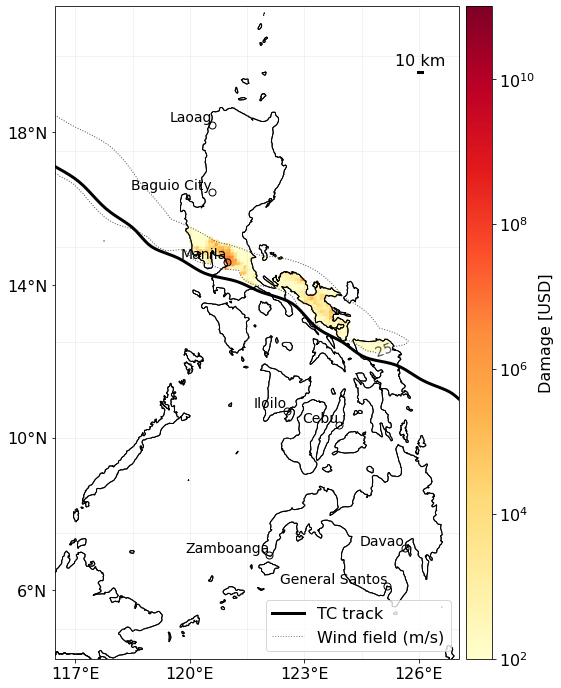

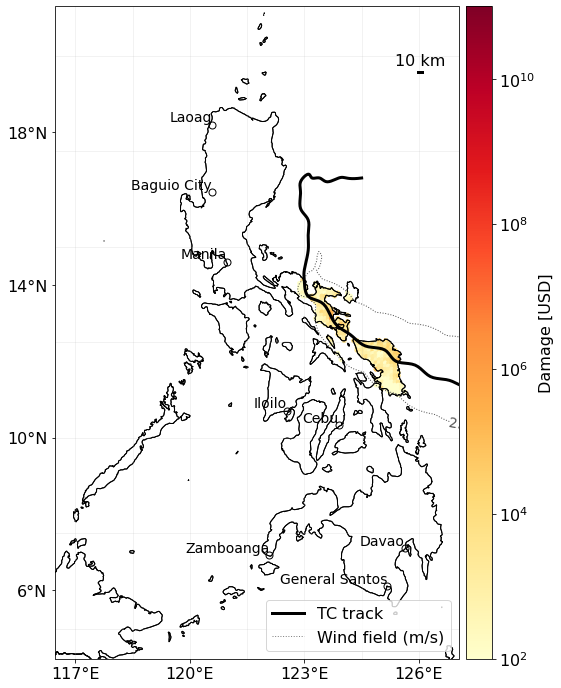

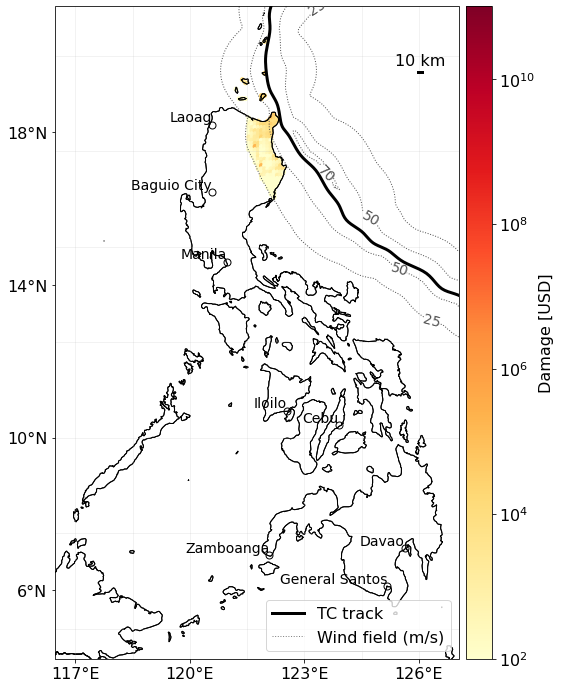

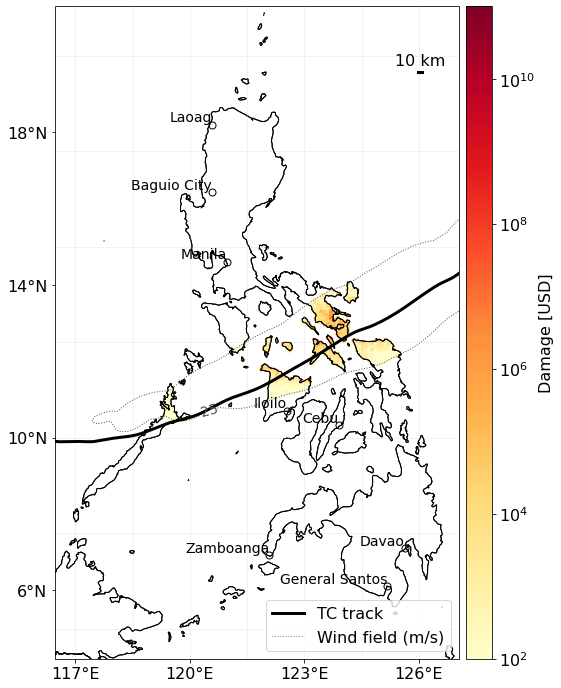

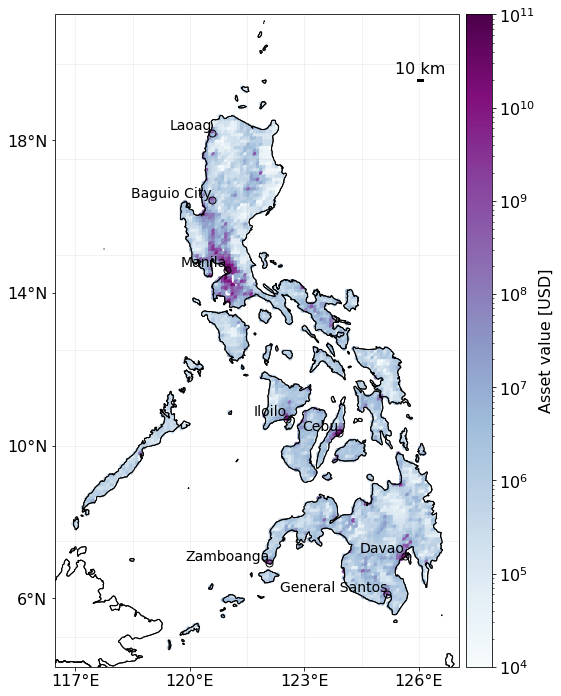

In [18]:
"""Plot Figure 7: make plots for up to 83 TCs making landfall in the Philippines"""
print("Warning: TC track data needs to be downloaded from IBTrACS seperately or requested from the authors.")
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 16}
plt.rc('font', **font)

def plot_impact(exposure, impact, hazard, tracks, event_id, name, ax, scale_pos):
    """ Plot exposed value, TC track and TC wind field. """
    extent = [exposure.longitude.min() - BUFFER_DEG_LON, exposure.longitude.max() + BUFFER_DEG_LON, 
               exposure.latitude.min() - BUFFER_DEG_LAT, exposure.latitude.max() + BUFFER_DEG_LAT]
    ax.set_extent((extent))
    u_plot.add_shapes(ax)
    imp_at_event = np.array(impact.imp_mat[event_id,:].todense()).flatten()
   
    scatter = u_plot.geo_scatter_from_array(imp_at_event, impact.coord_exp, 'Damage [USD]', '', \
            True, BUFFER_DEG_LAT, 'neither', proj=ccrs.PlateCarree(), axes=ax, s=15,
                         norm=LogNorm(vmin=MIN_VAL, vmax=MAX_VAL),
                         cmap='YlOrRd', vmin=1.0e2, vmax=MAX_VAL)
    ax.set_title('')
    ax.grid(False)
    #ax.set_xticks([118, 122, 126])
    scale_bar(ax, scale_pos, 10)

    track = tracks.data[event_id]
    ax.plot(track.lon.values, track.lat.values, linestyle='solid',
            transform=ccrs.PlateCarree(), lw=3, color='k')
    leg_lines = [Line2D([0], [0], color='k', lw=3), Line2D([0], [0], color='grey', lw=1, ls=':') ]
    # leg_names = ['%s track' %(name), 'Wind field (m/s)']
    leg_names = ['TC track', 'Wind field (m/s)']
    ax.legend(leg_lines, leg_names, loc=4) #, loc=label_loc['loc'])

    
    grid_x, grid_y = np.mgrid[hazard.centroids.coord[:, 1].min() : \
                              hazard.centroids.coord[:, 1].max() : complex(0, 2000), \
                              hazard.centroids.coord[:, 0].min() : \
                              hazard.centroids.coord[:, 0].max() : complex(0, 2000)]
    grid_im = griddata((hazard.centroids.coord[:, 1], 
                        hazard.centroids.coord[:, 0]), 
                        np.array(hazard.intensity[event_id].todense()).squeeze(), 
                        (grid_x, grid_y))
    cs = ax.contour(grid_x, grid_y, grid_im, linewidths=1.0, linestyles=':', \
                    levels=[25, 50, 70], colors=['#525252', '#525252', '#525252'])
    ax.clabel(cs, inline=1, fontsize=14, fmt='%1.0f')#, manual=cntour_loc)
    return scatter


def event_plots(exposure, impact, hazard, tracks, event_id, name):
    """ Plot TC track and contour lines, and damage. """
    f1, axes1 = plt.subplots(1, 1, figsize=(12, 12), squeeze=True, \
                             subplot_kw=dict(projection=ccrs.PlateCarree()))

    grid = axes1.gridlines(draw_labels=False, alpha=0.2)
    axes1.set_xticks([117, 120, 123, 126])
    axes1.set_yticks([6, 10, 14, 18])
    axes1.set_xticklabels(['117°E', '120°E', '123°E', '126°E'])
    axes1.set_yticklabels(['6°N', '10°N', '14°N', '18°N'])
    grid.xlabels_top = grid.ylabels_right = False
    grid.xformatter = LONGITUDE_FORMATTER
    grid.yformatter = LATITUDE_FORMATTER
    
    plot_impact(exposure, impact, hazard, tracks, event_id, name, axes1, (0.90, 0.90))
    plt.subplots_adjust(wspace=0)
    f1.subplots_adjust(right=0.88)
    return f1

def get_intensity_at_location(coordinates, hazard, event_id):
    cent_id = (abs(hazard.centroids.coord[:, 0]-coordinates[0]) == \
               min(abs(hazard.centroids.coord[:, 0]-coordinates[0]))) & \
        (abs(hazard.centroids.coord[:, 1]-coordinates[1]) == \
         min(abs(hazard.centroids.coord[:, 1]-coordinates[1])))
    cent_id = np.where(cent_id)[0][0]
    intensity = np.array(hazard.intensity[event_id].todense()).squeeze()[cent_id]
    coords = (hazard.centroids.coord[cent_id, 0], hazard.centroids.coord[cent_id, 1])
    return intensity, coords

# init figures:
figs = dict()
# loop over events:
names = list()
intensity_manila = list()

# (b-f) Maps of TC track & impacts (PLOTS FOR ALL 83 MATCHED TC EVENTS MAKING LANDFALL IN THE PHILIPPINES)
for i in df_phl.index: # This can take a few minutes
    names.append(df_phl.loc[i, 'name'])
    event_id = hazard.event_id[np.array(hazard.event_name)==df_phl.loc[i, 'ibtracsID']][0]-1
    
    intensity_manila.append(get_intensity_at_location(coord_manila, hazard, event_id)[0])
    coord_manila_centroids = get_intensity_at_location(coord_manila, hazard, event_id)[1]
    figs[i] = event_plots(exposure, impact, hazard, tracks, event_id, df_phl.loc[i, 'name'])
    if save_plots:
        figs[i].savefig(os.path.join(plots_dir_local, \
                'Fig6_impact_map_%s_%s_v2.pdf' %(df_phl.loc[i, 'ibtracsID'], df_phl.loc[i, 'name'])), \
                dpi=300, facecolor='w', edgecolor='w', \
                orientation='portrait', papertype=None, format='pdf', \
                transparent=False, bbox_inches=None, pad_inches=0.1, \
                frameon=None, metadata=None)
        figs[i].savefig(os.path.join(plots_dir_local, \
                'Fig6_impact_map_%s_%s_v2.png' %(df_phl.loc[i, 'ibtracsID'], df_phl.loc[i, 'name'])), \
                dpi=300, facecolor='w', edgecolor='w', \
                orientation='portrait', papertype=None, format='png', \
                transparent=False, bbox_inches=None, pad_inches=0.1, \
                frameon=None, metadata=None)

# (a) Asset exposure
exposure.tag.description=''
f1, ax = plt.subplots(1, 1, figsize=(12, 12), squeeze=True, \
                             subplot_kw=dict(projection=ccrs.PlateCarree()))
grid = ax.gridlines(draw_labels=False, alpha=0.2)
ax.set_xticks([117, 120, 123, 126])
ax.set_yticks([6, 10, 14, 18])
ax.set_xticklabels(['117°E', '120°E', '123°E', '126°E'])
ax.set_yticklabels(['6°N', '10°N', '14°N', '18°N'])
grid.xlabels_top = grid.ylabels_right = False
grid.xformatter = LONGITUDE_FORMATTER
grid.yformatter = LATITUDE_FORMATTER
    
extent = [exposure.longitude.min() - BUFFER_DEG_LON, exposure.longitude.max() + BUFFER_DEG_LON, 
            exposure.latitude.min() - BUFFER_DEG_LAT, exposure.latitude.max() + BUFFER_DEG_LAT]
ax.set_extent((extent))
u_plot.add_shapes(ax)
exp_array = np.array(exposure.value).flatten()

# Plot exposure values:
scatter = u_plot.geo_scatter_from_array(exp_array, impact.coord_exp, 'Asset value [USD]', '', \
            True, BUFFER_DEG_LAT, 'neither', proj=ccrs.PlateCarree(), axes=ax, s=15,
                         norm=LogNorm(vmin=1e4, vmax=MAX_VAL),
                         cmap='BuPu', vmin=1e4, vmax=MAX_VAL) # BuPu viridis cividis
ax.set_title('')
ax.grid(False)
scale_bar(ax, (0.90, 0.90), 10)

# # uncomment to plot tracks:
#for track in tracks.data:
#    ax.plot(track.lon.values, track.lat.values, linestyle='solid',
#            transform=ccrs.PlateCarree(), lw=2, color='k', alpha=.6)
#    leg_lines = [Line2D([0], [0], color='k', lw=2)]
#    leg_names = ['TC tracks of matched events']
#    ax.legend(leg_lines, leg_names, loc=4) #, loc=label_loc['loc'])

plt.subplots_adjust(wspace=0) 
f1.subplots_adjust(right=0.88)

if save_plots:
    plt.savefig(os.path.join(plots_dir_local, 'Fig6a_exposure_map_PHL.pdf'), \
             dpi=300, facecolor='w', edgecolor='w', \
                             orientation='portrait', papertype=None, format='pdf', \
                             transparent=False, bbox_inches=None, pad_inches=0.1, \
                             frameon=None, metadata=None)
    plt.savefig(os.path.join(plots_dir_local, 'Fig6a_exposure_map_PHL.png'), \
             dpi=300, facecolor='w', edgecolor='w', \
                             orientation='portrait', papertype=None, format='png', \
                             transparent=False, bbox_inches=None, pad_inches=0.1, \
                             frameon=None, metadata=None)

## Figure 8
Distribution of the event damage ratio (EDR) for 83 TCs making landfall in the Philippines from 1980 to 2017. The number of events for three ranges of EDR are compared, differentiating whether Manila was directly affected by the TC’s wind field (orange) or not (purple). Manila is considered to be affected if the hazard intensity exceeds $25 ms^{-1}$ at 14.5°N, 121.0°E.

/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:70: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.


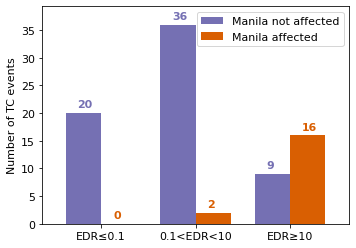

In [20]:
"""Figure 8: Manila"""

def get_intensity_at_location(coordinates, hazard, event_id):
    cent_id = (abs(hazard.centroids.coord[:, 0]-coordinates[0]) == \
               min(abs(hazard.centroids.coord[:, 0]-coordinates[0]))) & \
        (abs(hazard.centroids.coord[:, 1]-coordinates[1]) == \
         min(abs(hazard.centroids.coord[:, 1]-coordinates[1])))
    cent_id = np.where(cent_id)[0][0]
    intensity = np.array(hazard.intensity[event_id].todense()).squeeze()[cent_id]
    coords = (hazard.centroids.coord[cent_id, 0], hazard.centroids.coord[cent_id, 1])
    return intensity, coords

# loop over events:
names = list()
intensity_manila = list()

for i in df_phl.index:
    names.append(df_phl.loc[i, 'name'])
    event_id = hazard.event_id[np.array(hazard.event_name)==df_phl.loc[i, 'ibtracsID']][0]-1
    
    intensity_manila.append(get_intensity_at_location(coord_manila, hazard, event_id)[0])
    coord_manila_centroids = get_intensity_at_location(coord_manila, hazard, event_id)[1]

df_manila = pd.DataFrame({'name': names, 'intensity_manila': intensity_manila, \
                          'EDR': df_phl.ratio})
# df_manila.to_csv(os.path.join(DATA_DIR, 'PHL_TCs_v2_manila.csv'))

threshold = 25 # threshold for "affected" in meter per second, default: 25 m/s
df_manila_stats = pd.DataFrame(index=['EDR≤0.1', '0.1<EDR<10', 'EDR≥10'],\
                               columns=['Manila not affected', 'Manila affected'])
df_manila_stats.loc['EDR≤0.1', 'Manila affected'] = np.sum((df_manila.EDR<=0.1)\
                                                         & (df_manila.intensity_manila>threshold))
df_manila_stats.loc['EDR≤0.1', 'Manila not affected'] = np.sum((df_manila.EDR<=0.1)\
                                                         & (df_manila.intensity_manila<=threshold))
df_manila_stats.loc['EDR≥10', 'Manila affected'] = np.sum((df_manila.EDR>=10)\
                                                         & (df_manila.intensity_manila>threshold))
df_manila_stats.loc['EDR≥10', 'Manila not affected'] = np.sum((df_manila.EDR>=10)\
                                                         & (df_manila.intensity_manila<=threshold))
df_manila_stats.loc['0.1<EDR<10', 'Manila affected'] = np.sum((df_manila.EDR<10) & (df_manila.EDR>0.1)\
                                                         & (df_manila.intensity_manila>threshold))
df_manila_stats.loc['0.1<EDR<10', 'Manila not affected'] = np.sum((df_manila.EDR<10) & (df_manila.EDR>0.1)\
                                                         & (df_manila.intensity_manila<=threshold))
# df_manila_stats.to_csv(os.path.join(DATA_DIR, 'PHL_TCs_v2_manila_stats.csv'))

font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 11}

plt.rc('font', **font)
colors3 = ['#1b9e77', '#7570b3', '#d95f02'] # green / blue / orange
fig08, ax2 = plt.subplots(1, 1, figsize=(5.5, 4))
df_manila_stats.plot.bar(ax=ax2, width=.75, color=colors3[1:])
plt.xticks(rotation=0)
ax2.set_ylim([0, df_manila_stats.max().max()+3.3])
ax2.set_ylabel('Number of TC events')
for i, v in enumerate(df_manila_stats['Manila not affected']):
    ax2.text(i - .25, v + 1., str(v), color=colors3[1], fontweight='bold')
for i, v in enumerate(df_manila_stats['Manila affected']):
    ax2.text(i + .125, v + 1., str(v), color=colors3[2], fontweight='bold')
if save_plots:
    fig08.savefig(os.path.join(plots_dir_local, 'fig08_manila_bar_plot_%i_vector.pdf' %(threshold)), \
             dpi=300, facecolor='w', edgecolor='w', \
                         orientation='portrait', papertype=None, format='pdf', \
                         transparent=False, bbox_inches=None, pad_inches=0.1, \
                          frameon=None, metadata=None)
    fig08.savefig(os.path.join(plots_dir_local, 'fig08_manila_bar_plot_%i_pixel.png' %(threshold)), \
             dpi=300, facecolor='w', edgecolor='w', \
                         orientation='portrait', papertype=None, format='png', \
                         transparent=False, bbox_inches=None, pad_inches=0.1, \
                         frameon=None, metadata=None)

## Appendix

### Figure A1: EDR scatter plot over time
Event damage ratio (EDR) from 1980 to 2017 for matched 473 TC events worldwide. The nine calibration regions are differentiated by colour. The area size of the dots represents the absolute normalized reported damage (NRD) per event. The green shading demarcates the range from EDR=0.1 to 10.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


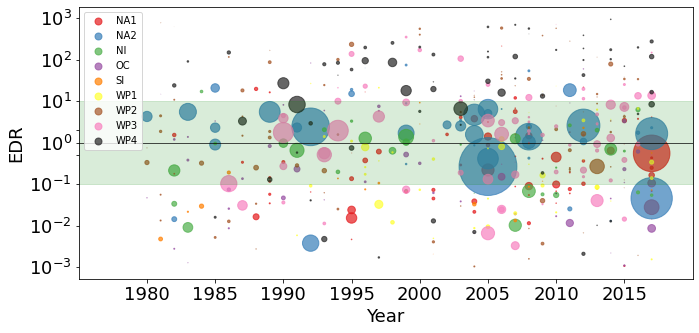

In [15]:
ylims = [1/1000, 1000]
fig_EDR_vs_time = plt.figure(facecolor='w', figsize=(5.5*2, 5))
ax_EDR_time = fig_EDR_vs_time.add_subplot(1,1,1)
ax_EDR_time.plot([1974, 2022], [1, 1], '-k', linewidth=1., alpha=.7)
results_def_IF['ratio'] = results_def_IF.climada_impact/results_def_IF.emdat_impact_scaled

for idx, reg in enumerate(regions_short):
    df_tmp = results_def_IF.loc[results_def_IF.cal_region2==reg]
    ax_EDR_time.scatter(df_tmp.year, df_tmp.climada_impact/df_tmp.emdat_impact_scaled, \
                      c=colors9b[idx], \
                      s=list(df_tmp.emdat_impact_scaled*2e-8), \
                      alpha=.7, label=reg)
ax_EDR_time.fill_between([1974, 2022], [.1, .1], [10, 10], \
            color='green', alpha=0.15)

ax_EDR_time.set_xlim([1975, 2020])
#ax_EDR_time.set_ylim(ylims)
ax_EDR_time.set_xticks(np.array([1980, 1985, 1990, 1995, 2000, 2005, 2010, 2015]))
lgnd = ax_EDR_time.legend(scatterpoints=1, fontsize=10)
for handle in lgnd.legendHandles:
    handle.set_sizes([49.0])
ax_EDR_time.set_xlabel('Year') 
ax_EDR_time.set_ylabel('EDR') 
ax_EDR_time.set_yscale('log')
ax_EDR_time.set_yticks(np.array([0.001, 0.01, 0.1, 0.5, 1, 2, 10, 100, 1000]))

if save_plots:
    fig_EDR_vs_time.savefig(os.path.join(plots_dir_local, 'figA01.pdf'),\
                    dpi=600, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)


### Figures A2 & A3: Scatter plots

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


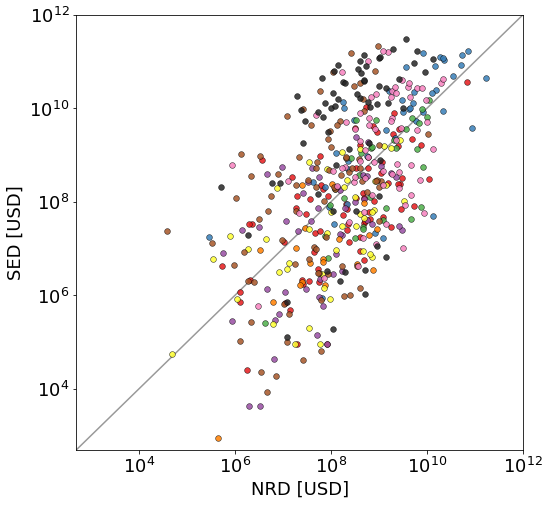

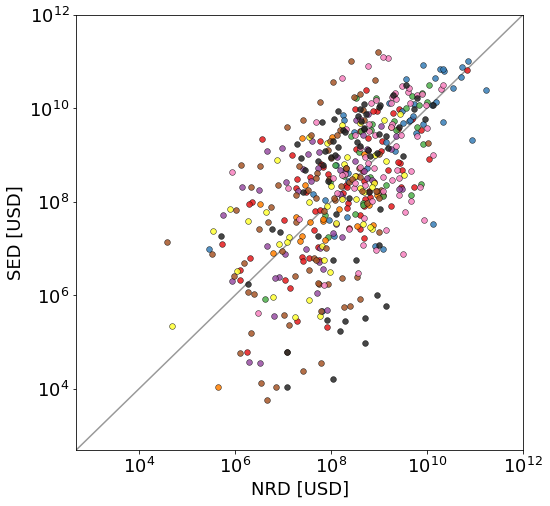

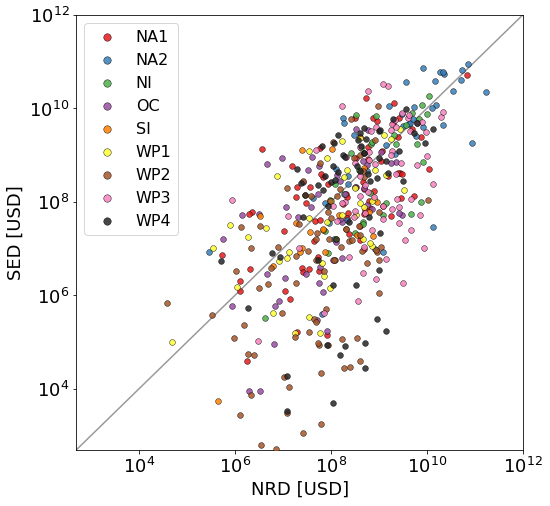

In [14]:
""" Figure A2: SED vs NDR """

font = {'family' : 'normal',
'weight' : 'normal',
'size'   : 18}
plt.rc('font', **font)
plt_size = 8
s_size = 33

## (a) default IF (uncalibrated)
fig_scatter_def = plt.figure(facecolor='w', figsize=(plt_size, plt_size))
lims=(5e2,1e12)
ax_scatter = fig_scatter_def.add_subplot(1,1,1)
ax_scatter.plot([lims[0], lims[1]], [lims[0], lims[1]], color='black', alpha=.4)

for idx, reg in enumerate(regions_short):
    ax_scatter.scatter(results_def_IF.loc[results_def_IF.cal_region2==reg].emdat_impact_scaled, \
                       results_def_IF.loc[results_def_IF.cal_region2==reg].climada_impact, \
                       s=s_size, marker='o', color=colors9b[idx], linewidths=.5, edgecolors='k', \
                       alpha=.85, label=reg, zorder=3)
ax_scatter.set_xscale('log')
ax_scatter.set_yscale('log')
ax_scatter.set_xlim(lims)
ax_scatter.set_ylim(lims)
ax_scatter.set_xlabel('NRD [USD]') 
ax_scatter.set_ylabel('SED [USD]') 

## (b) RMSF optimized
fig_scatter_RMSF = plt.figure(facecolor='w', figsize=(plt_size, plt_size))
lims=(5e2,1e12)
ax_scatter = fig_scatter_RMSF.add_subplot(1,1,1)
ax_scatter.plot([lims[0], lims[1]], [lims[0], lims[1]], color='black', alpha=.4)

for idx, reg in enumerate(regions_short):
    ax_scatter.scatter(events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==reg].emdat_impact_scaled, \
                       events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==reg].climada_impact, \
                       s=s_size, marker='o', color=colors9b[idx], linewidths=.5, \
                       edgecolors='k', alpha=.85, label=reg, zorder=3)
ax_scatter.set_xscale('log')
ax_scatter.set_yscale('log')
ax_scatter.set_xlim(lims)
ax_scatter.set_ylim(lims)
ax_scatter.set_xlabel('NRD [USD]') 
ax_scatter.set_ylabel('SED [USD]') 

## (c) TDR optimized
fig_scatter_TDR = plt.figure(facecolor='w', figsize=(plt_size, plt_size))
lims=(5e2,1e12)
ax_scatter = fig_scatter_TDR.add_subplot(1,1,1)
ax_scatter.plot([lims[0], lims[1]], [lims[0], lims[1]], color='black', alpha=.4)

for idx, reg in enumerate(regions_short):

    ax_scatter.scatter(events_df_tdr_if.loc[events_df_tdr_if.cal_region2==reg].emdat_impact_scaled, \
                       events_df_tdr_if.loc[events_df_tdr_if.cal_region2==reg].climada_impact, \
                       s=s_size, marker='o', color=colors9b[idx], linewidths=.5, \
                       edgecolors='k', alpha=.85, label=reg, zorder=3)
ax_scatter.set_xscale('log')
ax_scatter.set_yscale('log')
ax_scatter.set_xlim(lims)
ax_scatter.set_ylim(lims)
ax_scatter.set_xlabel('NRD [USD]') 
ax_scatter.set_ylabel('SED [USD]') 
leg = ax_scatter.legend(markerscale=1.3, fontsize=16)

if save_plots:
    fig_scatter_def.savefig(os.path.join(plots_dir_local, 'fig_A02_a_def_IF.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_scatter_RMSF.savefig(os.path.join(plots_dir_local, 'fig_A02_b_RMSF.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_scatter_TDR.savefig(os.path.join(plots_dir_local, 'fig_A02_c_TDR.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)

Correlation coefficients: 
{'(a) default_IF': -0.06266552237816642, '(b) RMSF_IF': -0.06127088364422901, '(c) TDR_IF': -0.04507078442933946}
p-values: 
{'(a) default_IF': 0.17363490702548878, '(b) RMSF_IF': 0.1834267118344176, '(c) TDR_IF': 0.3280108630155083}


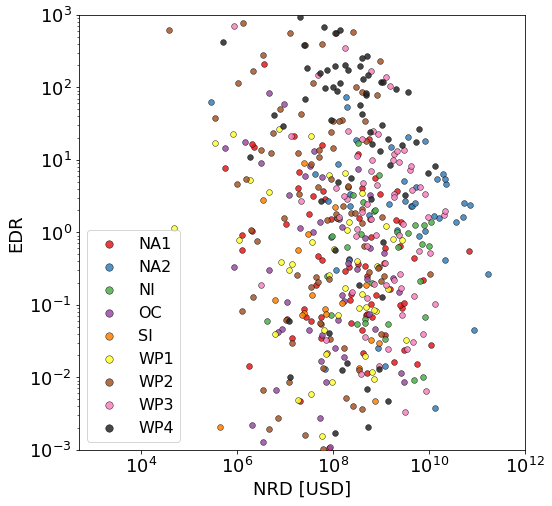

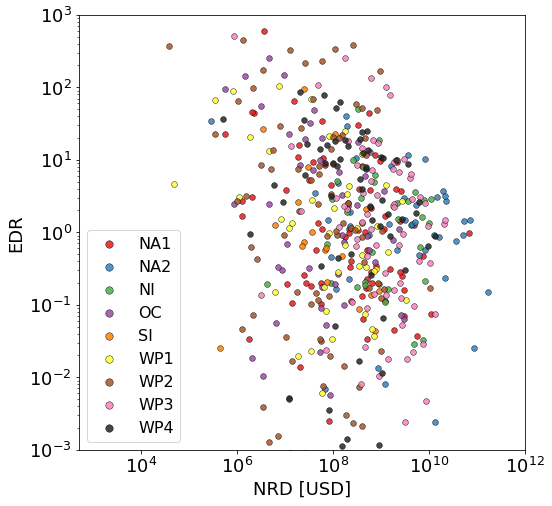

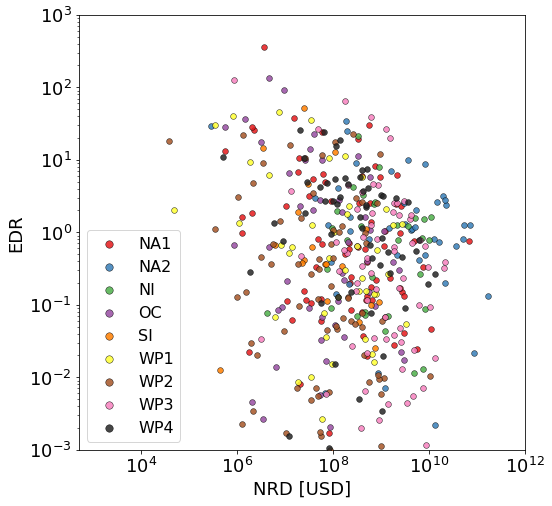

In [21]:
""" Figure A3: EDR vs NRD """

from scipy import stats

plt_str = 'AR2_ERD_vs_NRD'
font = {'family' : 'normal',
'weight' : 'normal',
'size'   : 18}
plt.rc('font', **font)
plt_size = 8
s_size = 33
x_log = True
y_log = True
x_label = 'NRD [USD]'
y_label = 'EDR'
x_lims = (5e2,1e12)
y_lims = (1/1000, 1000) 

results_def_IF['ratio'] = results_def_IF.climada_impact/results_def_IF.emdat_impact_scaled
events_df_rmsf_if['ratio'] = events_df_rmsf_if.climada_impact/events_df_rmsf_if.emdat_impact_scaled
events_df_tdr_if['ratio'] = events_df_tdr_if.climada_impact/events_df_tdr_if.emdat_impact_scaled

## (a) default IF (uncalibrated)
fig_scatter_def = plt.figure(facecolor='w', figsize=(plt_size, plt_size))

ax_scatter = fig_scatter_def.add_subplot(1,1,1)

for idx, reg in enumerate(regions_short):
    ax_scatter.scatter(results_def_IF.loc[results_def_IF.cal_region2==reg].emdat_impact_scaled, \
                       results_def_IF.loc[results_def_IF.cal_region2==reg].ratio, \
                       s=s_size, marker='o', color=colors9b[idx], linewidths=.5, edgecolors='k', \
                       alpha=.85, label=reg, zorder=3)
if x_log: ax_scatter.set_xscale('log')
if y_log: ax_scatter.set_yscale('log')
ax_scatter.set_xlim(x_lims)
ax_scatter.set_ylim(y_lims)
ax_scatter.set_xlabel(x_label) 
ax_scatter.set_ylabel(y_label) 
leg = ax_scatter.legend(markerscale=1.3, fontsize=16)

## (b) RMSF optimized
fig_scatter_RMSF = plt.figure(facecolor='w', figsize=(plt_size, plt_size))
ax_scatter = fig_scatter_RMSF.add_subplot(1,1,1)

for idx, reg in enumerate(regions_short):
    ax_scatter.scatter(events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==reg].emdat_impact_scaled, \
                       events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==reg].ratio, \
                       s=s_size, marker='o', color=colors9b[idx], linewidths=.5, \
                       edgecolors='k', alpha=.85, label=reg, zorder=3)
if x_log: ax_scatter.set_xscale('log')
if y_log: ax_scatter.set_yscale('log')
ax_scatter.set_xlim(x_lims)
ax_scatter.set_ylim(y_lims)
ax_scatter.set_xlabel(x_label) 
ax_scatter.set_ylabel(y_label) 
leg = ax_scatter.legend(markerscale=1.3, fontsize=16)

## (c) TDR optimized
fig_scatter_TDR = plt.figure(facecolor='w', figsize=(plt_size, plt_size))
ax_scatter = fig_scatter_TDR.add_subplot(1,1,1)

for idx, reg in enumerate(regions_short):

    ax_scatter.scatter(events_df_tdr_if.loc[events_df_tdr_if.cal_region2==reg].emdat_impact_scaled, \
                       events_df_tdr_if.loc[events_df_tdr_if.cal_region2==reg].ratio, \
                       s=s_size, marker='o', color=colors9b[idx], linewidths=.5, \
                       edgecolors='k', alpha=.85, label=reg, zorder=3)
if x_log: ax_scatter.set_xscale('log')
if y_log: ax_scatter.set_yscale('log')
ax_scatter.set_xlim(x_lims)
ax_scatter.set_ylim(y_lims)
ax_scatter.set_xlabel(x_label) 
ax_scatter.set_ylabel(y_label) 
leg = ax_scatter.legend(markerscale=1.3, fontsize=16)

if save_plots:
    fig_scatter_def.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_a_def_IF.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_scatter_RMSF.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_b_RMSF.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_scatter_TDR.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_c_TDR.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_scatter_def.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_a_def_IF.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_scatter_RMSF.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_b_RMSF.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_scatter_TDR.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_c_TDR.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)   
r2 = dict()
p_val = dict()
_, _, r2['(a) default_IF'], p_val['(a) default_IF'], _ = stats.linregress(results_def_IF.emdat_impact_scaled, results_def_IF.ratio)
_, _, r2['(b) RMSF_IF'], p_val['(b) RMSF_IF'], _ = stats.linregress(events_df_rmsf_if.emdat_impact_scaled, events_df_rmsf_if.ratio)
_, _, r2['(c) TDR_IF'], p_val['(c) TDR_IF'], _ = stats.linregress(events_df_tdr_if.emdat_impact_scaled, events_df_tdr_if.ratio)

print('Correlation coefficients: ')
print(r2)
print('p-values: ')
print(p_val)

### Table A1: List of countries per region
List of countries per calibration region. Countries marked with an asterisk (*) are considered for calibration (53 in total).

In [3]:
"""List countries per region"""
countries_overview = countries_overview.sort_values('name')
countries_overview = countries_overview.reset_index(drop=True)
s = '; '
m = '*'
regions_lists = dict()
regions_lists_ISO3_num = dict() # country_id
regions_lists_ISO3_alpha = dict() # alpha3
country_count = dict()
country_count_cal = dict()
for region in regions_short + ['ROW']:
    regions_lists[region] = ''
    regions_lists_ISO3_num[region] = []
    regions_lists_ISO3_alpha[region] = []
    country_count[region] = 0
    country_count_cal[region] = 0
for idx, c in enumerate(countries_overview.name):
    country_count[countries_overview.loc[idx, 'region']] += 1
    if countries_overview.loc[idx, 'cal']=='yes':
        m = '*'
        country_count_cal[countries_overview.loc[idx, 'region']] += 1
    else:
        m = ''
    regions_lists[countries_overview.loc[idx, 'region']] += c + m + s
    regions_lists_ISO3_num[countries_overview.loc[idx, 'region']].append(\
                           countries_overview.loc[idx, 'country_id'])
    regions_lists_ISO3_alpha[countries_overview.loc[idx, 'region']].append(\
                             countries_overview.loc[idx, 'alpha3'])

for region in regions_short + ['ROW']:
    regions_lists[region] = regions_lists[region][:-2]
    print('%s: %i (%i) \n%s\n ' %(region, country_count[region], country_count_cal[region], regions_lists[region]))
    
print(regions_lists_ISO3_num)
print(regions_lists_ISO3_alpha)

NA1: 48 (21) 
Anguilla; Antigua and Barbuda*; Argentina; Aruba; Bahamas*; Barbados; Belize*; Bermuda*; Bolivia, Plurinational State of; Cabo Verde*; Cayman Islands; Chile; Colombia; Costa Rica; Cuba*; Dominica*; Dominican Republic*; Ecuador; El Salvador; Falkland Islands (Malvinas); French Guiana; Grenada; Guadeloupe; Guatemala; Guyana; Haiti; Honduras*; Jamaica*; Martinique; Mexico*; Montserrat*; Nicaragua*; Panama; Paraguay; Peru; Puerto Rico*; Saint Helena, Ascension and Tristan da Cunha; Saint Kitts and Nevis*; Saint Lucia*; Saint Vincent and the Grenadines*; Sint Maarten (Dutch part); Suriname; Trinidad and Tobago*; Turks and Caicos Islands*; Uruguay; Venezuela, Bolivarian Republic of; Virgin Islands, British*; Virgin Islands, U.S.*
 
NA2: 2 (2) 
Canada*; United States of America*
 
NI: 36 (6) 
Afghanistan; Armenia; Azerbaijan; Bahrain; Bangladesh*; Bhutan; Djibouti; Eritrea; Ethiopia; Georgia; India*; Iran, Islamic Republic of; Iraq; Israel; Jordan; Kazakhstan; Kuwait; Kyrgyzstan

### Table A2: Results overview

Resulting impact function slope parameter $V_{half}$ and optimization metrics RMSF and TDR per region for (a) the global default impact function (uncalibrated), (b) calibrated by optimizing RMSF, and (c) calibrated by optimizing TDR. The regions NA1 to WP4 are defined in Table A1. The row “global” is based on one unified global calibration based on all matched TC 473 events. RMSF: root-mean-squared fraction; TDR: total damage ratio

In [6]:
print(results_table)

          region  N_countries      N  def_v_half   def_RMSF    def_TDR  \
0            NA1         21.0   73.0        74.7  11.839541   0.681363   
1            NA2          2.0   43.0        74.7   9.492628   2.109911   
2             NI          6.0   31.0        74.7   7.765999   0.846312   
3             OC         11.0   48.0        74.7  22.548375   0.602760   
4             SI          2.0   19.0        74.7  20.091360   0.196047   
5            WP1          4.0   43.0        74.7  15.191009   0.619114   
6            WP2          1.0   83.0        74.7  38.192557  25.892273   
7            WP3          1.0   69.0        74.7  15.154196   5.319794   
8            WP4          5.0   64.0        74.7  73.809464  35.555071   
9   GLB_combined          NaN    NaN        74.7  22.190438   4.689456   
10           GLB         53.0  473.0        74.7  22.190438   4.689456   

    rmsf_v_half  rmsf_RMSF   rmsf_TDR  tdr_v_half    tdr_RMSF   tdr_TDR  
0          59.6   9.801200   1.437412

## Supplement

### Figure S2: EDR per calibration region and per country in each ocean basin
Spread of event damage ratio (EDR) per country in each basin (a-d). The plots are based on data 35 from 11 countries and show the median (green), the first and third quartiles (IQR, blue box), data points outside the IQR but not
more than 1.5·IQR distance from either the first or the third quartile (black whiskers), and outliers (black circles).

/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:81: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:87: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:81: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:87: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/Users/eberenzs/opt/anaconda3/envs/climada_env/lib/python3.7/sit

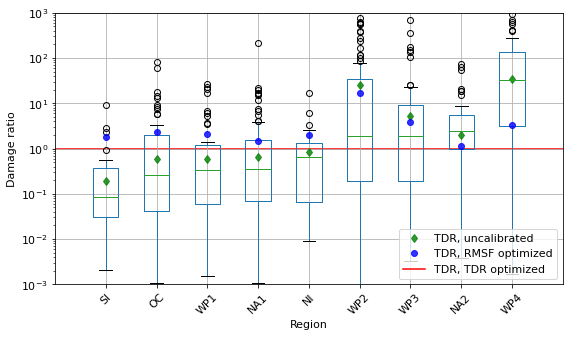

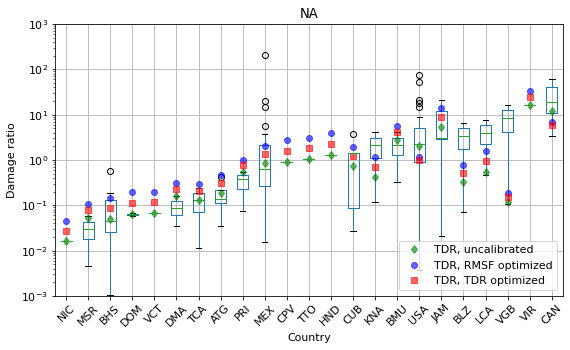

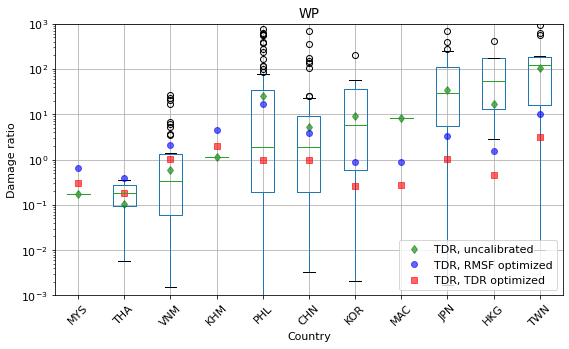

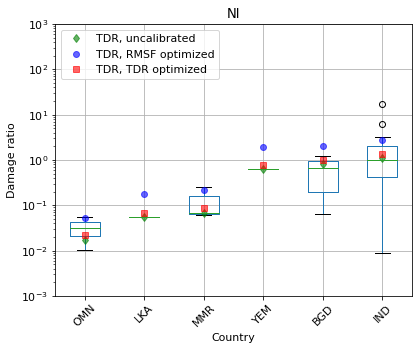

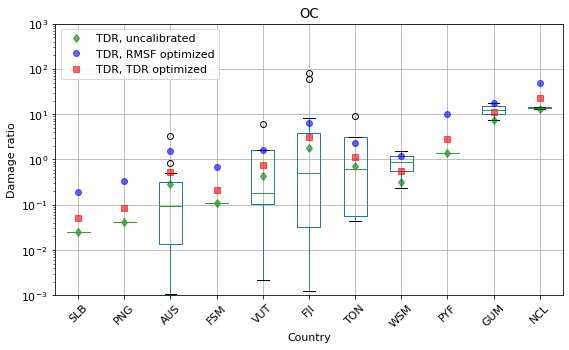

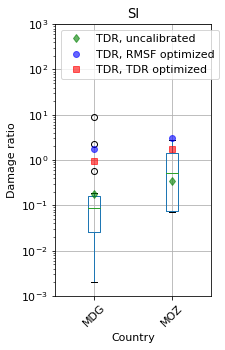

In [6]:
""" Supplement: Boxplots showing the distribution of damage ratio per region and country (EDR and TDR) """
wdth = 10
wdth_i = .9
hght = 5
colors = ['green', 'blue',  'red']
results_def_IF['ratio'] = results_def_IF.climada_impact/results_def_IF.emdat_impact_scaled

# Sorted boxplot of EDR per region:
fig_boxplot = plt.figure(facecolor='w', figsize=(1+min(9*wdth_i, \
                         wdth_i*len(results_def_IF['cal_region2'].unique())), hght))
ax_bp = fig_boxplot.add_subplot(1,1,1)
ax_bp = tc_cal.boxplot_sorted(results_def_IF, by=["cal_region2"], column="ratio")
ax_bp.set_ylim([1e-3, 1000])
ax_bp.set_xlim([0, len(list(ax_bp.get_xticklabels()))+1])
for idx, xtickl in enumerate(list(ax_bp.get_xticklabels())):
    if not idx:
        labels=['TDR, uncalibrated', 'TDR, RMSF optimized', 'TDR, TDR optimized']
    else:
        labels = [None, None, None]
    tdr_reg_def = results_def_IF.loc[results_def_IF.cal_region2==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
                    results_def_IF.loc[results_def_IF.cal_region2==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
    tdr_reg_RMSF = events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
                    events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
    tdr_reg_TDR = events_df_tdr_if.loc[events_df_tdr_if.cal_region2==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
                    events_df_tdr_if.loc[events_df_tdr_if.cal_region2==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
    ax_bp.plot(idx+1, tdr_reg_def, color=colors[0], marker='d', lw=0, linestyle=None, alpha=.8, label=labels[0])
    ax_bp.plot(idx+1, tdr_reg_RMSF, color=colors[1], marker='o', lw=0, linestyle=None, alpha=.8, label=labels[1])
    # ax_bp.plot(idx+1, tdr_reg_TDR, color=colors[2], marker='s', ls=None, alpha=.8, label=labels[2])
ax_bp.plot([0, len(list(ax_bp.get_xticklabels()))+1], [1, 1], color=colors[2], marker=None, alpha=1., label='TDR, TDR optimized', zorder=0)
ax_bp.legend(loc=4)
plt.title('')
plt.xlabel('Region')
plt.ylabel('Damage ratio')
plt.xticks(rotation=45)

# Sorted boxplot of EDR per country in each basin:
results_def_IF['cal_region'] = 'NN'
events_df_rmsf_if['cal_region'] = 'NN'
events_df_tdr_if['cal_region'] = 'NN'
fig_b = dict()
ax_b = dict()
leg_loc = [4, 4, 2, 2, 2]
for idx in results_def_IF.index:
    results_def_IF.loc[idx, 'cal_region'] = results_def_IF.loc[idx, 'cal_region2'][0:2]
for idx in events_df_rmsf_if.index:
    events_df_rmsf_if.loc[idx, 'cal_region'] = events_df_rmsf_if.loc[idx, 'cal_region2'][0:2]
for idx in events_df_tdr_if.index:
    events_df_tdr_if.loc[idx, 'cal_region'] = events_df_tdr_if.loc[idx, 'cal_region2'][0:2]
for idb, basin in enumerate(results_def_IF['cal_region'].unique()):
    results_CVA_ratio_reg = results_def_IF[results_def_IF['cal_region']==basin]
    results_CVA_ratio_reg = results_CVA_ratio_reg.replace([np.inf, -np.inf], np.nan)
    fig_b[basin] = plt.figure(facecolor='w', figsize=(1+min(9*wdth_i, \
                     wdth_i*len(results_CVA_ratio_reg['country'].unique())), hght))
    ax_b[basin] = fig_b[basin].add_subplot(1,1,1)
    ax_b[basin] = tc_cal.boxplot_sorted(results_CVA_ratio_reg, by=["country"], column="ratio")
    ax_b[basin].set_ylim([10**(-3), 1000])
    for idx, xtickl in enumerate(list(ax_b[basin].get_xticklabels())):
        if not idx:
            labels=['TDR, uncalibrated', 'TDR, RMSF optimized', 'TDR, TDR optimized']
        else:
            labels = [None, None, None]
        tdr_reg_def = results_def_IF.loc[results_def_IF.country==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
                        results_def_IF.loc[results_def_IF.country==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
        tdr_reg_RMSF = events_df_rmsf_if.loc[events_df_rmsf_if.country==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
                        events_df_rmsf_if.loc[events_df_rmsf_if.country==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
        tdr_reg_TDR = events_df_tdr_if.loc[events_df_tdr_if.country==xtickl.__dict__['_text'], 'climada_impact'].sum() / \
                        events_df_tdr_if.loc[events_df_tdr_if.country==xtickl.__dict__['_text'], 'emdat_impact_scaled'].sum()
        ax_b[basin].plot(idx+1, tdr_reg_def, color=colors[0], marker='d', lw=0, linestyle=None, alpha=.6, label=labels[0])
        ax_b[basin].plot(idx+1, tdr_reg_RMSF, color=colors[1], marker='o', lw=0, linestyle=None, alpha=.6, label=labels[1])
        ax_b[basin].plot(idx+1, tdr_reg_TDR, color=colors[2], marker='s', lw=0, linestyle=None, alpha=.6, label=labels[2])
    ax_b[basin].legend(loc=leg_loc[idb])    
    plt.title(basin)
    plt.xlabel('Country')
    plt.ylabel('Damage ratio')
    plt.xticks(rotation=45)
    if save_plots:
        fig_b[basin].savefig(os.path.join(plots_dir_local, 'S1_EDR_TDR_basin_%s.pdf' %(basin)),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches='tight', pad_inches=0.1, \
                    frameon=None, metadata=None)
        
        fig_b[basin].savefig(os.path.join(plots_dir_local, 'S1_EDR_TDR_basin_%s.png' %(basin)),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches='tight', pad_inches=0.1, \
                    frameon=None, metadata=None)
if save_plots:
    fig_boxplot.savefig(os.path.join(plots_dir_local, 'S1_EDR_TDR_regions.pdf'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches='tight', pad_inches=0.1, \
                    frameon=None, metadata=None)
    fig_boxplot.savefig(os.path.join(plots_dir_local, 'S1_EDR_TDR_regions.png'),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches='tight', pad_inches=0.1, \
                    frameon=None, metadata=None)


['NA1', 'NA2', 'NI', 'OC', 'SI', 'WP1', 'WP2', 'WP3', 'WP4']


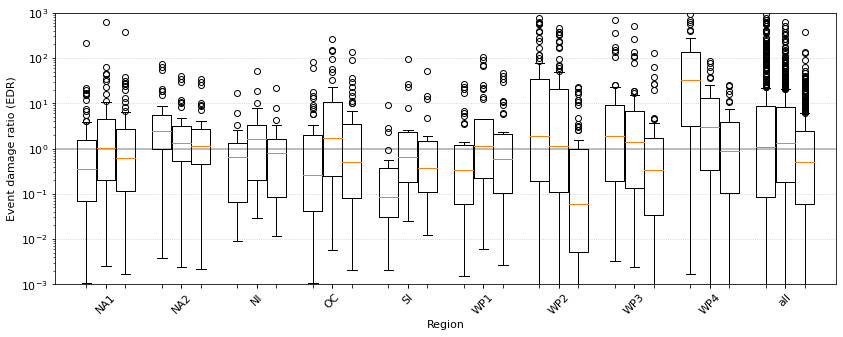

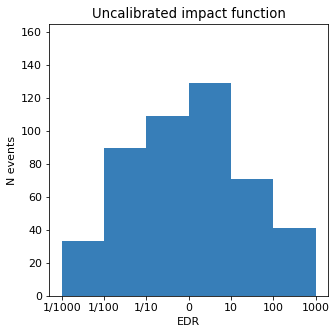

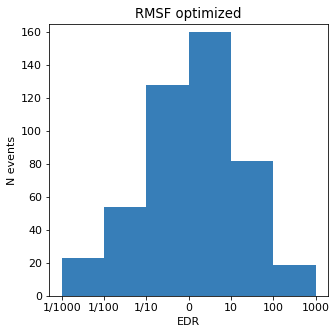

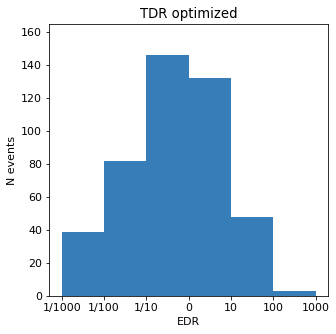

In [13]:
""" Additional damage ratio boxplot per region: comparing uncalibrated and calibrated distribution of EDR """
wdth = 14
wdth_i = .9
hght = 5
colors = ['green', 'blue',  'red'] # uncalibrated, RMSF optimized, TDR optimized
results_def_IF['ratio'] = results_def_IF.climada_impact/results_def_IF.emdat_impact_scaled
events_df_rmsf_if['ratio'] = events_df_rmsf_if.climada_impact/events_df_rmsf_if.emdat_impact_scaled
events_df_tdr_if['ratio'] = events_df_tdr_if.climada_impact/events_df_tdr_if.emdat_impact_scaled

regions = list(np.sort(results_def_IF.cal_region2.unique()))
print(regions)
data_group1 = list() # uncalibrated
data_group2 = list() # RMSF optimized
data_group3 = list() # TDR optimized
for reg in regions:
    data_group1.append(list(results_def_IF.loc[results_def_IF.cal_region2==reg, 'ratio']))
    data_group2.append(list(events_df_rmsf_if.loc[events_df_rmsf_if.cal_region2==reg, 'ratio']))
    data_group3.append(list(events_df_tdr_if.loc[events_df_tdr_if.cal_region2==reg, 'ratio']))
data_group1.append(list(results_def_IF.ratio))
data_group2.append(list(events_df_rmsf_if.ratio))
data_group3.append(list(events_df_tdr_if.ratio))
regions.append('all')
data_groups = [data_group3, data_group2, data_group1]

# --- Labels for your data:
labels_list = regions
width       = 0.3
xlocations  = [ x*((1+ len(data_groups))*width) for x in range(len(data_group1)) ]

symbol      = 'ko'
ymin        = 1e-3 # min ( [ val  for dg in data_groups  for data in dg for val in data ] )
ymax        = 1e3 # max ( [ val  for dg in data_groups  for data in dg for val in data ])

fig_ = plt.figure(facecolor='w', figsize=(wdth, hght))

ax = fig_.add_subplot(1,1,1)
ax.set_ylim(ymin,ymax)
ax.set_yscale('log')
ax.grid(True, linestyle='dotted', alpha=.7, axis='y')
ax.set_axisbelow(True)

plt.xlabel('Region')
plt.ylabel('Event damage ratio (EDR)')
plt.title('')

space = len(data_groups)/2
offset = len(data_groups)/2

ax.set_xticks( xlocations )
ax.set_xticklabels( labels_list, rotation=45 )
# --- Offset the positions per group:

group_positions = []
for num, dg in enumerate(data_groups):    
    _off = (0 - space + (0.5+num))
    group_positions.append([x-_off*(width+0.01) for x in xlocations])

for dg, pos in zip(data_groups, group_positions):
    plt.boxplot(dg, 
    #            sym=symbol,
    #            labels=['']*len(labels_list),
                labels=['']*len(labels_list),           
                positions=pos, 
                widths=width, 
    #           notch=False,  
    #           vert=True, 
    #           whis=1.5,
    #           bootstrap=None, 
    #           usermedians=None, 
    #           conf_intervals=None,
    #           patch_artist=False,
                )
ax.axhline(1, color='black', alpha=.333, label=None, zorder=0)

"""Histograms of EDR"""
plt_str = 'EDR_hist'
fig_hist_EDR = plt.figure(facecolor='w', figsize=(5, 5))
ax_h = fig_hist_EDR.add_subplot(1,1,1)
ax_h.hist(np.log10(results_def_IF.ratio), log=False, bins=[-3, -2, -1, 0, 1, 2, 3], color=colors9b[1])
ax_h.set_xlabel("EDR")
ax_h.set_xticks([-3, -2, -1, 0, 1, 2, 3])
ax_h.set_xticklabels(['1/1000', '1/100', '1/10', '0', '10', '100', '1000'])
ax_h.set_ylabel("N events")
ax_h.set_ylim((0, 165))
ax_h.set_title('Uncalibrated impact function')

fig_hist_EDR_RMSF = plt.figure(facecolor='w', figsize=(5, 5))
ax_h = fig_hist_EDR_RMSF.add_subplot(1,1,1)

ax_h.hist(np.log10(events_df_rmsf_if.ratio), log=False, bins=[-3, -2, -1, 0, 1, 2, 3], color=colors9b[1])
ax_h.set_xlabel("EDR")
ax_h.set_xticks([-3, -2, -1, 0, 1, 2, 3])
ax_h.set_xticklabels(['1/1000', '1/100', '1/10', '0', '10', '100', '1000'])
ax_h.set_ylabel("N events")
ax_h.set_ylim((0, 165))
ax_h.set_title('RMSF optimized')

fig_hist_EDR_TDR = plt.figure(facecolor='w', figsize=(5, 5))
ax_h = fig_hist_EDR_TDR.add_subplot(1,1,1)

ax_h.hist(np.log10(events_df_tdr_if.ratio), log=False, bins=[-3, -2, -1, 0, 1, 2, 3], color=colors9b[1])
ax_h.set_xlabel("EDR")
ax_h.set_xticks([-3, -2, -1, 0, 1, 2, 3])
ax_h.set_xticklabels(['1/1000', '1/100', '1/10', '0', '10', '100', '1000'])
ax_h.set_ylabel("N events")
ax_h.set_ylim((0, 165))
ax_h.set_title('TDR optimized')

if save_plots:
    fig_hist_EDR.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_a_def_IF.pdf'),\
                    dpi=600, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_hist_EDR.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_a_def_IF.png'),\
                    dpi=600, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_hist_EDR_RMSF.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_b_RMSF.png'),\
                    dpi=600, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)
    fig_hist_EDR_TDR.savefig(os.path.join(plots_dir_local, f'fig_{plt_str}_c_TDR.png'),\
                    dpi=600, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='png', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, metadata=None)

### Figure S3: Calibration detail plots per region: RMSF and TDR

Calibration metrics used for the fitting of Vhalf per region: The lines show the cost functions total damage ratio (TDR, red) and root-mean-squared fraction (RMSF, black) as functions of the impact function shape parameter $V_{half}$. The optimized values of TDR and RMSF are marked with a round dot. The vertical blue lines demarcate individually fitted values of $V_{half}$ per event. For the individual fitting per event, the value of $V_{half}$ is determined that would be required to obtain an event damage ratio (EDR) equal to 1.

/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:68: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:68: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:68: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:68: MatplotlibDeprecationWarning: 
The frameon kwarg was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use facecolor instead.
/opt/anaconda3/envs/climada_env/lib/python3.7/site-packages/ipykernel_launcher.py:68: MatplotlibDeprecationWarning: 
The fra

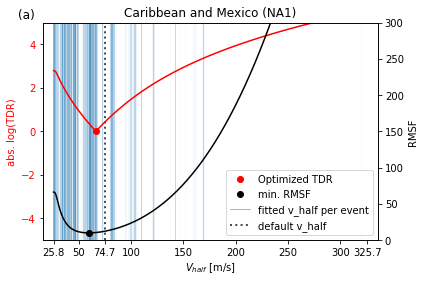

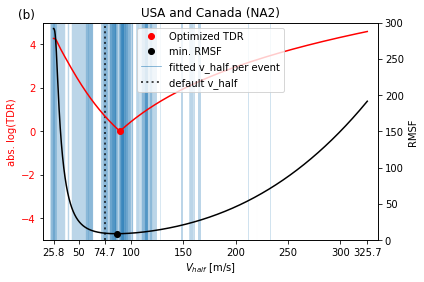

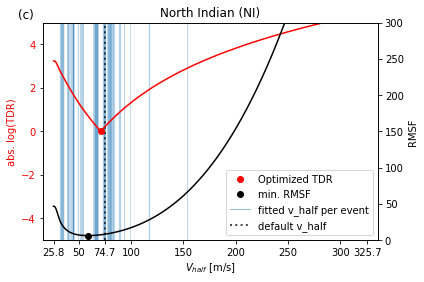

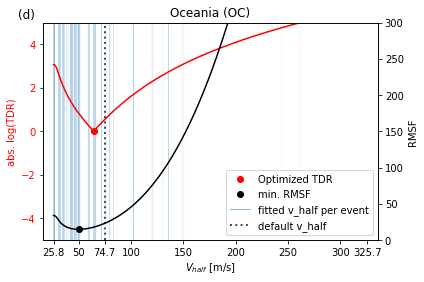

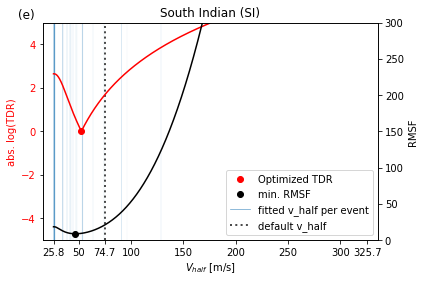

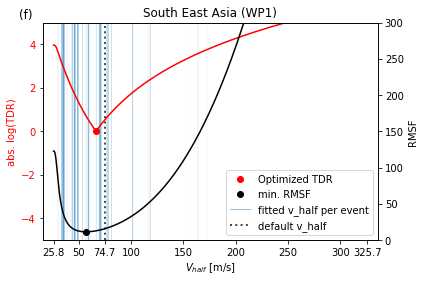

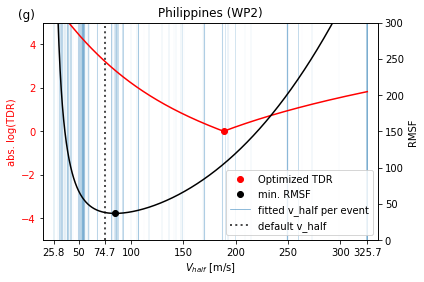

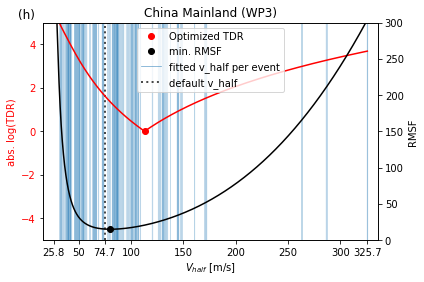

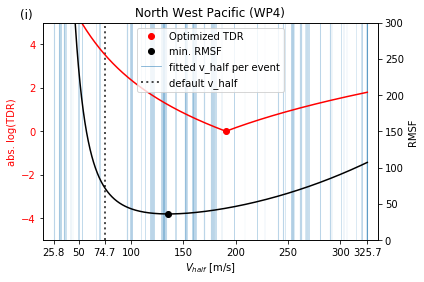

In [38]:
fig_rmsf_tdr = dict()
ax_tdr = dict()
ax_rmsf = dict()
v0 = [25.7]
alphabet = 'abcdefghijklmnop'

for idr, reg in enumerate(regions_short):
    fig_rmsf_tdr[reg] = plt.figure(facecolor='w')

    df = full_cal_range_df_tdr.loc[full_cal_range_df_tdr.cal_region2==reg]
    ax_tdr[reg] = fig_rmsf_tdr[reg].add_subplot(1,1,1)
    ax_tdr[reg].plot(-results_tdr.v_half.loc[results_tdr.cal_region2==reg].values, \
                 df.log_ratio_total_impact.loc[df.v_half==results_tdr.v_half.loc[results_tdr.cal_region2==reg].values[0]].values, \
                 'ro', label='Optimized TDR')
    ax_tdr[reg].plot(-results_rmsf.v_half.loc[results_rmsf.cal_region2==reg].values, \
                 results_rmsf.RMSF.loc[results_rmsf.cal_region2==reg].values, 'ko', label='min. RMSF')
    
    for idx, v_half in enumerate(results_closest_ratio.v_half.loc[results_closest_ratio.cal_region2==reg].values):
        emdat_scaled = results_closest_ratio.emdat_impact_scaled.loc[results_closest_ratio.cal_region2==reg].values[idx]
        
        if idx==0:

            ax_tdr[reg].axvline(x=v_half, alpha=0.3, \
                    lw=0.5*np.sqrt(emdat_scaled/1e8), label=None)
            
            ax_tdr[reg].axvline(x=-v_half, alpha=0.7, lw=0.7, label='fitted v_half per event')
        else:
            ax_tdr[reg].axvline(x=v_half, alpha=0.3, \
                    lw=0.5*np.sqrt(emdat_scaled/1e8), label=None)
    ax_tdr[reg].axvline(x=74.7, color='k', alpha=0.7, lw=2, ls=':', label='default v_half')
   
    df_rmsf = full_cal_range_df_rmsf.loc[full_cal_range_df_rmsf.cal_region2==reg]
    ax_rmsf[reg] = ax_tdr[reg].twinx()
    ax_rmsf[reg].plot(df_rmsf.v_half, df_rmsf.RMSF, 'k', zorder=1)
    ax_rmsf[reg].plot(results_rmsf.v_half.loc[results_rmsf.cal_region2==reg].values, \
                 results_rmsf.RMSF.loc[results_rmsf.cal_region2==reg].values, 'ko', label='min. RMSF')
    
    ax_tdr[reg].plot(df.v_half, np.abs(df.log_ratio_total_impact), 'r')
    ax_tdr[reg].plot(results_tdr.v_half.loc[results_tdr.cal_region2==reg].values, \
                 df.log_ratio_total_impact.loc[df.v_half==results_tdr.v_half.loc[results_tdr.cal_region2==reg].values[0]].values, \
                 'ro', label=None)

    ax_tdr[reg].tick_params(axis='y', labelcolor='red')
    ax_tdr[reg].set_ylabel('abs. log(TDR)', color='red')
    ax_tdr[reg].set_ylim((-5,5))
    
    ax_tdr[reg].set_title(regions_long[reg])
    ax_tdr[reg].set_xlabel('$V_{half}$ [m/s]')
    ax_tdr[reg].set_xlim((v0[0]-10, v0[0]+310))
    ax_tdr[reg].set_xticks(np.array([25.8, 50, 74.7, 100, 150, 200, 250, 300, 325.7]))
    ax_tdr[reg].set_xticklabels(['25.8', '50', '74.7', '100', '150', '200', '250', '300', '325.7'])

    ax_rmsf[reg].set_ylabel('RMSF', color='black')
    ax_rmsf[reg].tick_params(axis='y', labelcolor='black')
    ax_rmsf[reg].set_ylim((0,300))
    if reg in ['WP3', 'WP4', 'NA2']:
        loc = 9

    else:
        loc = 4
    ax_tdr[reg].legend(loc=loc, framealpha=.8)
    ax_tdr[reg].text(-0.3, 5.2, "(%s)" %(alphabet[idr]), size=12, ha="center")
    if save_plots:
        fig_rmsf_tdr[reg].savefig(os.path.join(plots_dir_local, 'S2_calibration_details_%s.pdf' %(reg)),\
                    dpi=300, facecolor='w', edgecolor='w', \
                    orientation='portrait', papertype=None, format='pdf', \
                    transparent=False, bbox_inches=None, pad_inches=0.1, \
                    frameon=None, metadata=None)